In [1]:
# ------------------------------------------#
#        Expt 5: Perform a battery of negative inference tests from a single script and plot results, save metadata    
# ------------------------------------------#

Threads.nthreads()
begin
    using LinearAlgebra 
    using Plots
    using FFTW
    using FileIO
    using JLD2
    using DiffEqFlux
    using OrdinaryDiffEq
    using BlockArrays
    using LaTeXStrings
    using SparseArrays
    using BSON
    using Distances
    using DifferentialEquations
    using Optimization
    using OptimizationPolyalgorithms
    using Zygote
    using OptimizationOptimJL
    using OptimizationOptimisers
    using DiffEqSensitivity
    using DelimitedFiles
    using HDF5
    using Plots
    using InvertedIndices
    using Random
    using Statistics
    using LineSearches
    using CSV
    using DataFrames
    using ChainRulesCore
end 

In [2]:
filename = "/home/tschala/research/LANL/case1_1_1D_waveforms_results.h5"
file = h5open(filename, "r")
# Read the dataset
data1d = read(file["data"])

# Close the file
close(file)

In [3]:
filename = "/home/tschala/research/LANL/case1_1_1D_waveforms_ICA_results.h5"
file = h5open(filename, "r")
# Read the dataset
data1d_ICA = read(file["data"])

# Close the file
close(file)

data1d = cat(data1d, data1d_ICA, dims=3);

300×110×48×4 Array{Float64, 4}:
[:, :, 1, 1] =
 1.54923  1.56436  1.57939  1.59439  …  1.44483  1.42797  1.40989  1.40009
 1.53538  1.53632  1.53727  1.53822     1.35798  1.35411  1.35003  1.34785
 1.51954  1.51329  1.50709  1.5009      1.42455  1.42883  1.4334   1.43586
 1.50182  1.50391  1.50601  1.5081      1.465    1.46196  1.45871  1.45695
 1.48237  1.48179  1.48124  1.48069     1.45901  1.45913  1.45926  1.45934
 1.46135  1.461    1.46068  1.46035  …  1.46627  1.4667   1.46717  1.46742
 1.43894  1.43943  1.43996  1.44049     1.46136  1.46129  1.46121  1.46116
 1.4153   1.41554  1.41581  1.41608     1.44939  1.44984  1.45031  1.45057
 1.39065  1.39107  1.39153  1.39199     1.43569  1.43617  1.43668  1.43695
 1.36518  1.36572  1.3663   1.36688     1.41794  1.41845  1.419    1.4193
 1.33909  1.33966  1.34026  1.34086  …  1.39781  1.39844  1.3991   1.39945
 1.31262  1.31325  1.31391  1.31457     1.37603  1.37668  1.37738  1.37775
 1.28596  1.28663  1.28733  1.28802     1.35273  1.353

In [5]:
println("Size of 1D data matrix:",size(data1d))
println("Shape: [timesteps,spatial locations,waveforms,variables]")

# note that some elements in space a duplicate
# the real spatial size is 100

Size of 1D data matrix:(300, 110, 48, 4)
Shape: [timesteps,spatial locations,waveforms,variables]


In [6]:
# remove duplicate data (both ends of a segment are saved)
data1d_fix = data1d[200:end,Not(11:11:end),:,:];
# remove the unphysical peaks, just replace with linear interpolation
# data1d_fix[:,41,:,1] = (data1d_fix[:,40,:,1] + data1d_fix[:,42,:,1])/2;
# data1d_fix[:,61,:,1] = (data1d_fix[:,60,:,1] + data1d_fix[:,62,:,1])/2;

In [7]:
# heatmap(data1d_fix[:,:,20,1], title="flow rate heatmap", cbar_title = "flow rate [cm3/s]")
# xlabel!("x")
# ylabel!("time")


In [8]:
# heatmap(data1d_fix[1:end,:,20,2], title="pressure heatmap", cbar_title = "pressure [dyn/cm2]")

In [9]:
begin
    global dz = 0.04                     # x step
    global T = 1.0                   # total time
    global L = 3.96                   # total length
    global zspan = (0,L)                 # end points of time integration for ODEProbem
    global dt = 0.01                   #time step
    global train_maxiters = 5         # number of iterations of learning
    global learning_rate  = 0.01         # learning rate , currently using PolyOpt default (0.1)


end

0.01

In [10]:
path_to_working_directory="/home/tschala/research/LANL/juliaDiffProgExample/"

include("$path_to_working_directory/src/numerical_derivatives.jl");
include("$path_to_working_directory/src/train_utils.jl");

In [11]:
#first order derivatives
∂t1_center = f1_secondOrder_central(101,dt);
∂t1_forward = f1_secondOrder_forward(101,dt);
∂t1_backward = f1_secondOrder_backward(101,dt);

# use central difference for the majority
∂t1 = ∂t1_center
# use forward and backward difference near the boundaries
∂t1[1,:]=∂t1_forward[1,:]
∂t1[end,:] = ∂t1_backward[end,:]

101-element SparseVector{Float64, Int64} with 3 stored entries:
  [99 ]  =  50.0
  [100]  =  -200.0
  [101]  =  150.0

In [18]:
#waveforms to use
waveforms = 30


# Set the seed for reproducibility
Random.seed!(123)

# # # Shuffle the indices of the vector
# shuffled_indices = randperm(size(data1d_fix)[3])

# # # Divide the shuffled indices into training and test sets
# train_indices = shuffled_indices[1:waveforms];
# test_indices = shuffled_indices[waveforms+1:end];

# Shuffle the indices of the vector
shuffled_indices = 1:48

# Divide the shuffled indices into training and test sets
train_indices = [shuffled_indices[7:24];shuffled_indices[31:41]];
test_indices = shuffled_indices[25:30];
test_indices_ex = [shuffled_indices[1:6];shuffled_indices[42:end]];

In [19]:
# select field variable ID
# 1 - flow rate, 2 - pressure, 3 - area, 4 - Wall Shear Stress
pID = 1

1

In [20]:
#define IC's
u0 = data1d_fix[1,1:end,train_indices,pID];
u01 = data1d_fix[1,1:end,1,pID];

u0_test = data1d_fix[1,1:end,test_indices,pID];
u0_ex = data1d_fix[1,1:end,test_indices_ex,pID];

#ground truth data
ytrain2 = data1d_fix[:,1:end,train_indices,pID];
ytrain21 = data1d_fix[:,1:end,1,pID];

ytest2 = data1d_fix[:,1:end,test_indices,pID];
yex2 = data1d_fix[:,1:end,test_indices_ex,pID];

#boundary conditions
bc_flow = data1d_fix[:,1,train_indices,pID];
bc_flow1 = bc_flow[:,1];

bc_flow_test = data1d_fix[:,1,test_indices,pID];
bc_flow_ex  = data1d_fix[:,1,test_indices_ex,pID];

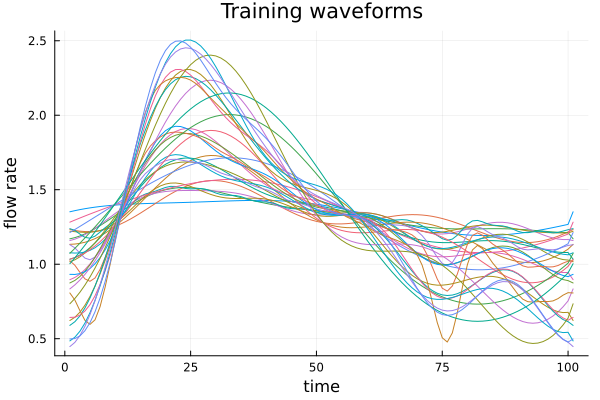

In [21]:
plot(bc_flow, legend = false)
xlabel!("time")
ylabel!("flow rate")
title!("Training waveforms")

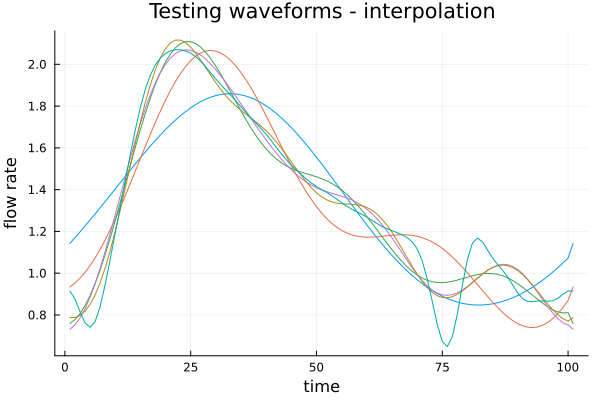

In [22]:
plot(bc_flow_test, legend = false)
xlabel!("time")
ylabel!("flow rate")
title!("Testing waveforms - interpolation")

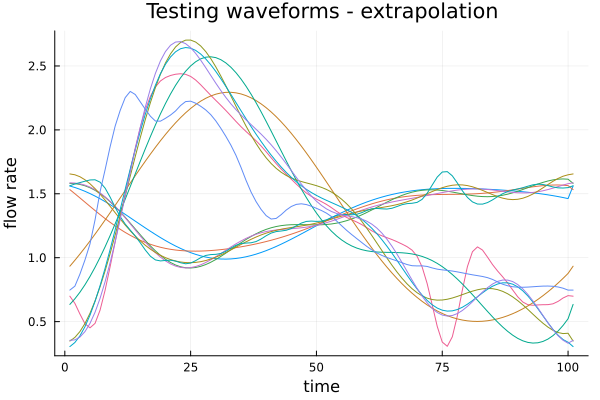

In [23]:
plot(bc_flow_ex, legend = false)
xlabel!("time")
ylabel!("flow rate")
title!("Testing waveforms - extrapolation")

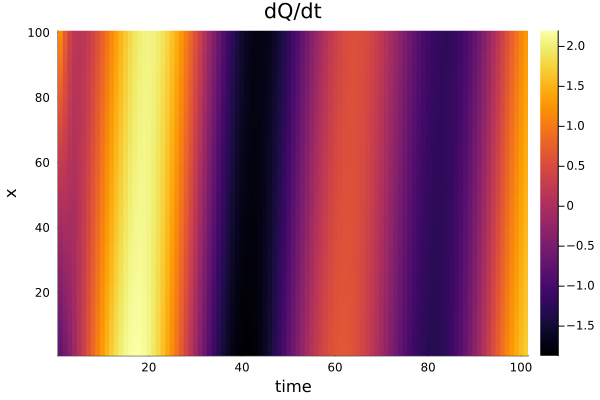

In [24]:
heatmap((∂t1 * ytrain2[:,:,2])')
xlabel!("time")
ylabel!("x")
title!("dQ/dt")

In [25]:
Nspace = size(u01,1)   # number of points in space
x = 0.0 : dz : L        # discretized spatial dimension 

# finite-difference schemes

#first order derivatives
∂x1_center = f1_secondOrder_central(Nspace,dz);
∂x1_forward = f1_secondOrder_forward(Nspace,dz);
∂x1_backward = f1_secondOrder_backward(Nspace,dz);

# use central difference for the majority
∂x1 = ∂x1_center
# use forward and backward difference near the boundaries
∂x1[1,:]=∂x1_forward[1,:]
∂x1[end,:] = ∂x1_backward[end,:]

#second order derivatives
∂x2_center = f2_secondOrder_central(Nspace,dz);
∂x2_forward = f2_secondOrder_forward(Nspace,dz);
∂x2_backward = f2_secondOrder_backward(Nspace,dz);

# use central difference for the majority
∂x2 = ∂x2_center;
# use forward and backward difference near the boundaries
∂x2[1,:]=∂x2_forward[1,:];
∂x2[end,:] = ∂x2_backward[end,:];

In [26]:
aID = 3
#ground truth data for area
Atrain = data1d_fix[:,1:end,train_indices,aID];
Atrain1 = data1d_fix[:,1:end,1,aID];

Atest = data1d_fix[:,1:end,test_indices,aID];
Aex = data1d_fix[:,1:end,test_indices_ex,aID];

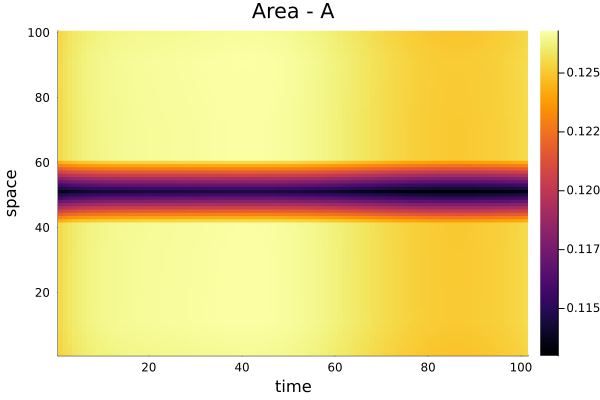

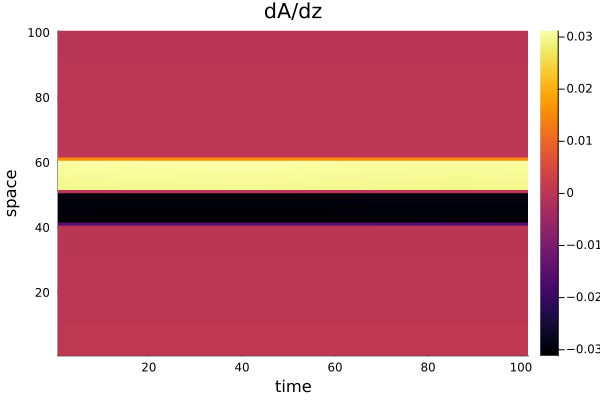

In [27]:
# calculate derivative of area with respect to space
dAdz = zero(Atrain)
dAdz_test = zero(Atest)
dAdz_ex = zero(Aex)
for i in 1:size(Atrain)[1]
    dAdz[i,:,:] = ∂x1 * Atrain[i,:,:]
    dAdz_test[i,:,:] = ∂x1 * Atest[i,:,:]
    dAdz_ex[i,:,:] = ∂x1 * Aex[i,:,:]
end

#plot area for first simulation/waveform
h1 = heatmap(Atrain[:,:,1]')
xlabel!("time")
ylabel!("space")
title!("Area - A")
display(h1)

heatmap(dAdz[:,:,1]')
xlabel!("time")
ylabel!("space")
title!("dA/dz")

In [28]:
N = size(bc_flow1,1)
# NN embedded in PDE for Differential programming
# Define the network architecture with initialization
hidden_dim = 10

ann = Chain(
    Dense(N, hidden_dim, tanh, init = Flux.glorot_uniform),
    Dense(hidden_dim, hidden_dim, tanh, init = Flux.glorot_uniform),
    Dense(hidden_dim, hidden_dim, tanh, init = Flux.glorot_uniform),
    Dense(hidden_dim, N, init = Flux.glorot_uniform)
)

Chain(
  Dense(101 => 10, tanh),               # 1_020 parameters
  Dense(10 => 10, tanh),                # 110 parameters
  Dense(10 => 10, tanh),                # 110 parameters
  Dense(10 => 101),                     # 1_111 parameters
)                   # Total: 8 arrays, 2_351 parameters, 9.684 KiB.

In [29]:
# flatten parameters in NN for learning.                
p, re = Flux.destructure(ann);
ps = deepcopy(p)
p_size = size(p,1);
println("Number of parameters in neural network: $p_size"); 

Number of parameters in neural network: 2351


In [30]:
# # Define time-dependent variables
function interpolate_variables(t, vector)
    # t - dependent variable, could be time or space (z) too
    #      if t is time then use dt, if it's space use dz, same with T <--> L
    # vector - data vector with values at distinct t locations
    #
    # This function interpolates values such that we can access the values from vector
    # not just at the original data points but anywhere in between
    

    # Find the two closest points in vector
    #caculate the time index that's closest to time t

    t_index = Int(floor(t / dz)) + 1

    # calculate local time fraction between the grid points
    t_frac = (t - (t_index - 1) * dz) / dz

    # Perform linear interpolation between data points in vector
    # if we are at the last timesteps just copy the value cause t_index+1 will not exist
    if t == L
        vector_interp = vector[:,:,t_index]
        
    else
        vector_interp = (1 - t_frac) * vector[:,:,t_index] + t_frac * vector[:,:,t_index + 1]
    end
    
    # return the interpolated value of vector at time(space) = t
    return vector_interp
end


# # Define time-dependent boundary condition function
interp_func(z) = interpolate_variables(z, atrain)


interp_func (generic function with 1 method)

In [31]:
# parabolic flow profile constant
# https://simvascular.github.io/docs1DSimulation.html#solver
δ = 1/3;
# viscosity in CGS units
ν = 0.04;
# velocity profile constant
Nprof = -8*π*ν;

In [32]:
function learn_1DBlood(u, p, z, interp_func, dadz_interp_func)
    # u - input to neural network, field variable we are solving for (flow rate)
    # p - neural network parameters
    # z - dependent variable (z -space, or t - time)
    # interp_func - area values for interpolation as a function of z
    # dadz_interp_func - dA/dz values for interpolation as a function of z
    
    
    Φ = re(p)  # restructure flattened parameter vector into NN architecture.
    

    #concatenate u and the BC as input to the NN
#     input = vcat(u)
    
    # add some physics term to the right-hand-side
    # 1/2*Q/A*dA/dz + N/(2*(1+δ))
    
    #
    #.+ 1/2 .* u ./ interp_func(z) .* dadz_interp_func(z) .+ Nprof/(2*(1+δ))
    #.-1/(2*(1+δ)) .* interp_func(z) ./ u .* (∂t1 * u) 
    
#     println("space z: ", z)
#     println("term 1: 1/2*Q/S*dS/dz ", sum(1/2 .* u ./ interp_func(z) .* dadz_interp_func(z)))
#     println("term 2 N/2(1+delta): ", sum(Nprof/(2*(1+δ))))
#     println("term 3 -1/2(1+d)*S/Q*dQ/dt: ", sum(-1/(2*(1+δ)) .* interp_func(z) ./ u .* (∂t1 * u)))
#     println("Mean area S: ", mean(interp_func(z)), "size S: ", size(interp_func(z)))
#     println("Mean area dS/dz: ", mean(dadz_interp_func(z)))
#     println("Mean Previous flow rate Q:", mean(u), ", std Q:", std(u), "size Q: ", size(u))
#     println("Mean Q/S:", mean(u ./ interp_func(z)))
#     println("Mean S/Q:", mean(interp_func(z) ./ u))
#     println("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
#     flush(stdout)
    
#     plotQ = plot(u)
#     display(plot(plotQ))
#     sleep(1)
    
    return Φ(u) # .+ 1/2 .* u ./ interp_func(z) .* dadz_interp_func(z) .+ Nprof/(2*(1+δ))
end

# #define learning problem.
learn_1DBlood_prob(u01,zspan) =  ODEProblem((u, p, z) -> learn_1DBlood(u, p, z, bc_left_func,dadz_interp_func), u01, zspan, p)

learn_1DBlood_prob (generic function with 1 method)

In [33]:
ode_solver = "Tsit5"
output_dir = "/home/tschala/research/LANL/dQdz_physics_testNODE"
working_dir = output_dir


prob = ODEProblem((u, p, z) -> learn_1DBlood(u, p, z,bc_left_func,dadz_interp_func), bc_flow1, zspan, p) ;
function predict(θ,prob)
    if ode_solver == "Tsit5"
        Array(solve(prob,Tsit5(),p=θ,dt=dz,saveat=dz,adaptive=true))
    elseif ode_solver == "RK4"
        Array(solve(prob,RK4(),p=θ,dt=dz/10,saveat=dz,adaptive=false,alg_hints=[:stiff]))
    elseif ode_solver == "Rosenbrock23"
        Array(solve(prob,Rosenbrock23(),p=θ,dt=dz/10,saveat=dz,adaptive=false,alg_hints=[:stiff]))
    end
end 

predict (generic function with 1 method)

In [34]:
function loss(θ, ytrain21, prob)
    pred = predict(θ, prob)
    
    dqdx_loss = 0.0
    for i in 1:size(ytrain21)[2]
        dqdx_loss += sum(abs2,(∂x1 * pred[:,i,:]' - ∂x1 * ytrain21[:,i,:]'))
    end
    l = sum(abs2,(pred - ytrain21)) + 10*dqdx_loss  # + 0.0*dudt #  + 1e-3*sum(abs.(θ)) #add regularization
    return l, pred
end


# l , pred = loss(ps,ytrain21,prob)

# training optimizer definition
adtype = Optimization.AutoZygote() ;
optf = Optimization.OptimizationFunction((x,p)->loss(x,ytrain21,prob),adtype) ;

In [35]:
path_checkpoint=nothing
optimizer_choice1 = "ADAM"
optimizer_choice2 = "BFGS"

"BFGS"

In [36]:
# process user choices

if !isdir(working_dir)
    mkdir(working_dir)
end
output_dir = working_dir*"/output/"
cd(working_dir) #switch to working directory
if !isdir(output_dir)
    mkdir(output_dir)
end
println("optimizer 1 is $optimizer_choice1")
if !isnothing(optimizer_choice2)
    println("optimizer 2 is $optimizer_choice2 optimizer")
end

println("ODE Time integrator selected:", ode_solver)


optimizer 1 is ADAM
optimizer 2 is BFGS optimizer
ODE Time integrator selected:Tsit5


In [37]:
# restart training from previaous checkpoint if it exists, else start 
# fresh training.
transfer_learning = true
global uinit
if transfer_learning
    #load learnt parameters from file
    p_learn = load("/home/tschala/research/LANL/trained_models/dQdz_1/ptrained_BFGS.jld2")
    uinit = p_learn["p"];
    println("Transfer learning - loaded weights from file")
else
    uinit = deepcopy(ps)
    println("Fresh training initialized")
end

Transfer learning - loaded weights from file


In [38]:
L = 3.96  # total length
zspan = (0.0, L)
println(zspan)
tsteps = 0:dz:zspan[2]  # create time vector

n_epochs = 1
#set batch size
batch_size = 10
println("Batch size:", batch_size)
#training batches
batch_iterations = Int(ceil(size(ytrain2,3)/batch_size))
#testing batches
test_batch_iterations = Int(ceil(size(ytest2,3)/batch_size));
ex_batch_iterations = Int(ceil(size(yex2,3)/batch_size));

(0.0, 3.96)
Batch size:10


waveform batch: 1/3
Max iters:5
Choosing ADAM Optimizer.


┌ Warning: Layer with Float32 parameters got Float64 input.
│   The input will be converted, but any earlier layers may be very slow.
│   layer = Dense(101 => 10, tanh)  # 1_020 parameters
│   summary(x) = "101×10 Matrix{Float64}"
└ @ Flux ~/.julia/packages/Flux/EHgZm/src/layers/stateless.jl:60


Iteration: 1 || Loss: 7.913877400804779
Iteration: 2 || Loss: 12972.897701738511
Iteration: 3 || Loss: 9579.41264265148
Iteration: 4 || Loss: 3563.9012046980606
Iteration: 5 || Loss: 2983.8893254729446
Iteration: 6 || Loss: 7.913877400804779
saving ADAM checkpoint...
Sum of params:9.343865
Switching to BFGS optimizer
Max iters:10
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 7.913877400804779
Iteration: 2 || Loss: 7.742737658124142
Iteration: 3 || Loss: 7.690454691859526
Iteration: 4 || Loss: 7.666120889406367
Iteration: 5 || Loss: 7.646650193315217
Iteration: 6 || Loss: 7.632488533152164
Iteration: 7 || Loss: 7.616100845932396
Iteration: 8 || Loss: 7.606320937782267
Iteration: 9 || Loss: 7.597652928775371
Iteration: 10 || Loss: 7.594007423139706
Iteration: 11 || Loss: 7.509500260840964
saving BFGS checkpoint...
saved trained params to ptrained_BFGS.jld2
Sum of params:9.348766
Epoch 1 loss:7.509500260840964


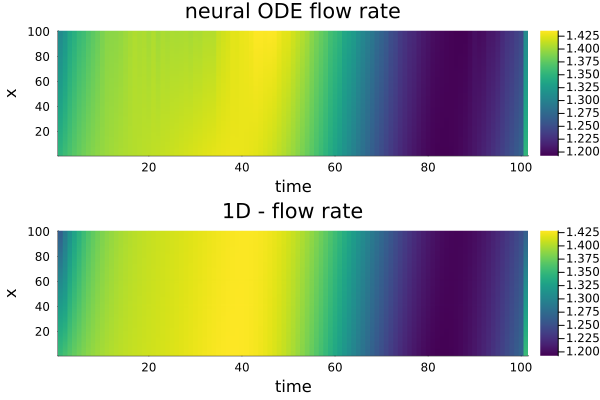

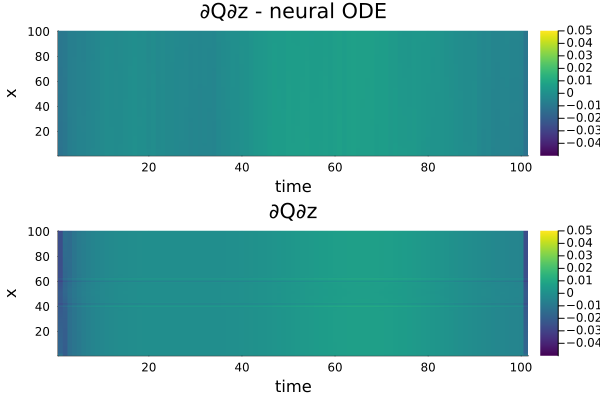

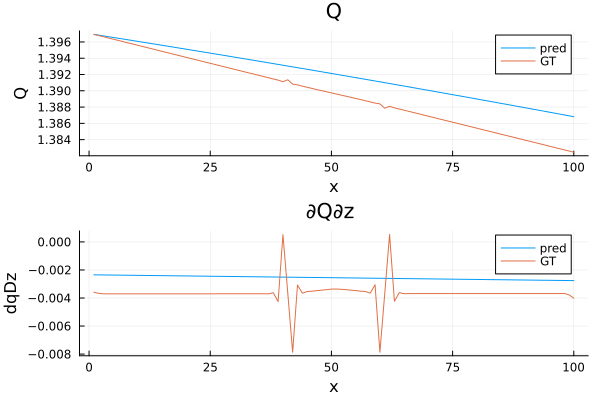

waveform batch: 2/3
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 7.933872351028932
Iteration: 2 || Loss: 11997.095095532844
Iteration: 3 || Loss: 4508.840385223307
Iteration: 4 || Loss: 4690.306966661385
Iteration: 5 || Loss: 2611.5048977475712
Iteration: 6 || Loss: 7.933872351028932
saving ADAM checkpoint...
Sum of params:9.348766
Switching to BFGS optimizer
Max iters:10
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 7.933872351028932
Iteration: 2 || Loss: 7.841428560750012
Iteration: 3 || Loss: 7.702563058181685
Iteration: 4 || Loss: 7.621894068574411
Iteration: 5 || Loss: 7.549812779201988
Iteration: 6 || Loss: 7.42551029876856
Iteration: 7 || Loss: 7.325968414401247
Iteration: 8 || Loss: 7.316605005743307
Iteration: 9 || Loss: 7.302757012015305
Iteration: 10 || Loss: 7.2944480140091
Iteration: 11 || Loss: 7.27609501321106
saving BFGS checkpoint...
saved trained params to ptrained_BFGS.jld2
Sum of params:9.349678
Epoch 1 loss:7.27609501321106


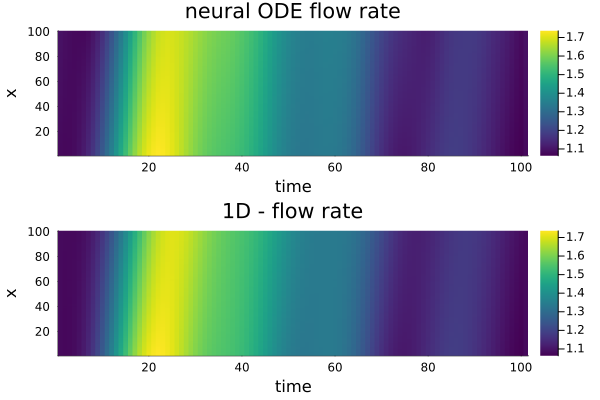

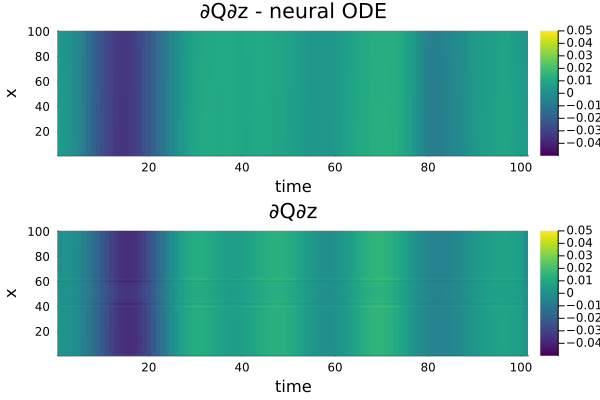

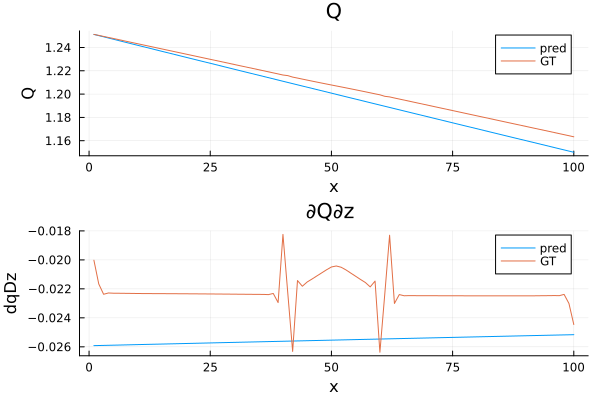

waveform batch: 3/3
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 21.319234443078784
Iteration: 2 || Loss: 16793.622641947008
Iteration: 3 || Loss: 3830.965938885045
Iteration: 4 || Loss: 5205.427195701256
Iteration: 5 || Loss: 2876.2868608075064
Iteration: 6 || Loss: 21.319234443078784
saving ADAM checkpoint...
Sum of params:9.349678
Switching to BFGS optimizer
Max iters:10
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 21.319234443078784
Iteration: 2 || Loss: 21.297666402740756
Iteration: 3 || Loss: 21.250119066707953
Iteration: 4 || Loss: 21.214378138561244
Iteration: 5 || Loss: 21.14866382302767
Iteration: 6 || Loss: 21.110264612921608
Iteration: 7 || Loss: 21.07819145650687
Iteration: 8 || Loss: 21.065840855065296
Iteration: 9 || Loss: 21.044597569828046
Iteration: 10 || Loss: 21.016202002951115
Iteration: 11 || Loss: 20.874304045974323
saving BFGS checkpoint...
saved trained params to ptrained_BFGS.jld2
Sum of params:9.340311
Epoch 1 loss:20.874304045974323


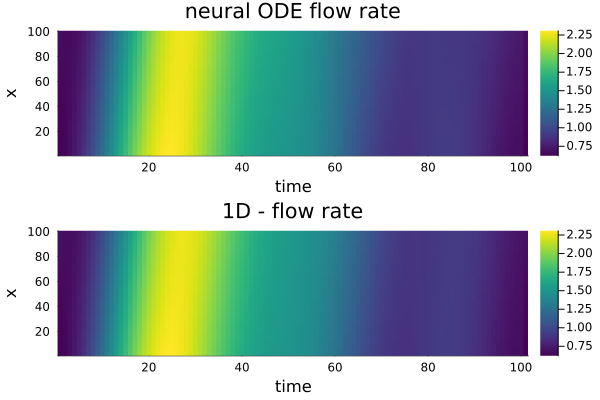

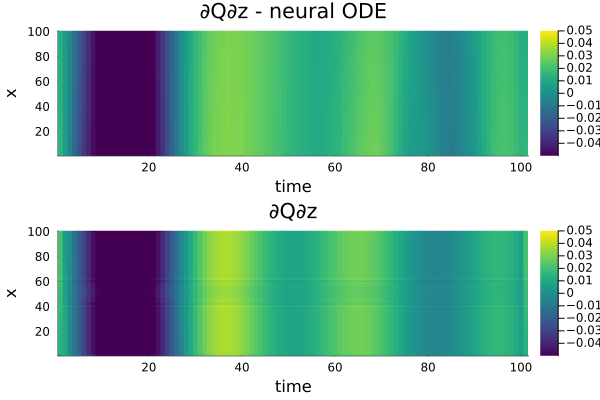

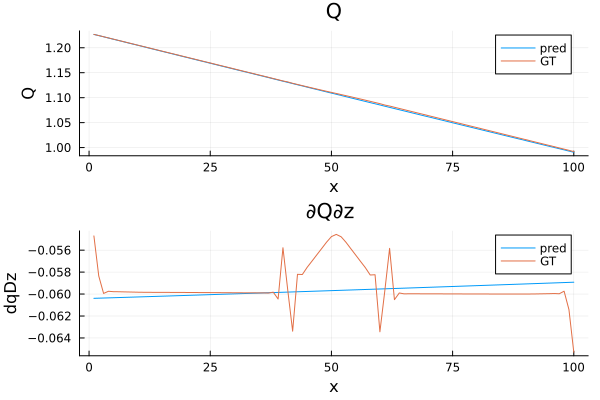

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing - interpolation:
waveform batch: 1/1
Test loss - interpolation:6.904876991255469


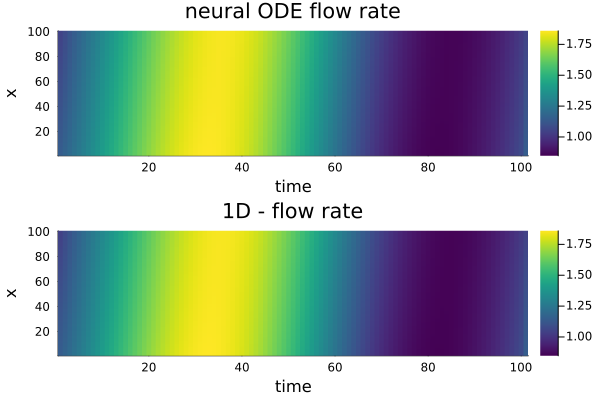

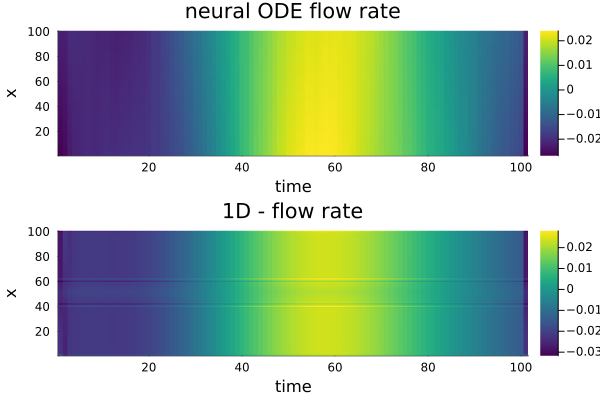

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing - extrapolation:
waveform batch: 1/2
Test loss - extrapolation:25.729522709805966


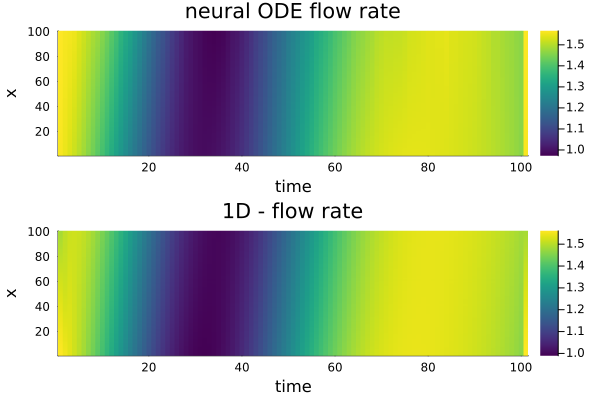

waveform batch: 2/2
Test loss - extrapolation:146.34802905331875


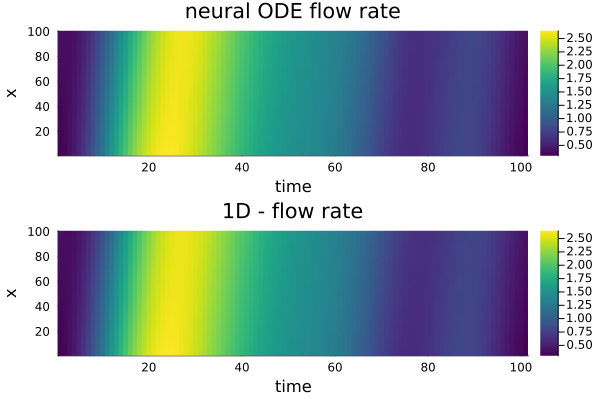

 mean train loss:1.2296517006905636
 mean test loss - interpolation:1.1508128318759114
 mean test loss - extrapolation:13.236734751009594


In [39]:
pred_train = []
pred_interp = []
pred_extrap = []


for j in 1:n_epochs
    list_loss_train = []
    list_loss_epoch = []
    list_loss_test = []
    list_loss_epoch_test = []
    list_loss_ex = []
    list_loss_epoch_ex = []
    loss_tot = 0.0
    loss_tot_test = 0.0
    loss_tot_ex = 0.0
    # loop over different waveforms
    for i in 1:batch_iterations

        println("waveform batch: ",i, "/",batch_iterations)
        flush(stdout)
        #reorder ytrain, atrain and dAdz to [time, batch_size, spatial location]
        # batch size should be second column

        #reorder ytrain to (spatial location, batch_size, time)
        if i!=batch_iterations
            ytrain = permutedims(ytrain2[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
            atrain = permutedims(Atrain[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
            dadztrain = permutedims(dAdz[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
        else
            ytrain = permutedims(ytrain2[:,:,batch_size*(i-1)+1:end],(1,3,2))
            atrain = permutedims(Atrain[:,:,batch_size*(i-1)+1:end],(1,3,2))
            dadztrain = permutedims(dAdz[:,:,batch_size*(i-1)+1:end],(1,3,2))
        end


        #define function for interpolating area and dA/dz to the actual spatial location for the ODE
        interp_func(z) = interpolate_variables(z, atrain)
        dadz_interp_func(z) = interpolate_variables(z, dadztrain)

        #define optimization problem
        prob = ODEProblem((u, p, z) -> learn_1DBlood(u, p, z, interp_func,dadz_interp_func), ytrain[:,:,1], zspan, p);
        optf = Optimization.OptimizationFunction((x,p)->loss(x,ytrain[:,:,:],prob),adtype) ;


        uinit = train_loop(uinit,adtype,optf,train_maxiters,learning_rate,optimizer_choice1)
        println("Sum of params:", sum(uinit))

        if !isnothing(optimizer_choice2)
            println("Switching to $optimizer_choice2 optimizer")

            uinit = train_loop(uinit,adtype,optf,train_maxiters*2,learning_rate,optimizer_choice2)

            println("Sum of params:", sum(uinit))

        end
        
        
        #calculate final loss and push it to the list
        prob = ODEProblem((u, p, z) -> learn_1DBlood(u, p, z, interp_func,dadz_interp_func), ytrain[:,:,1], zspan, p);
        l , pred = loss(uinit,ytrain[:,:,:],prob)
        loss_tot = loss_tot + l

        push!(list_loss_train, l)
        println("Epoch ", j, " loss:", l)
        
        push!(pred_train, pred)

        # plot solution for comparison
        plot1 = heatmap(pred[:,1,:]', color=:viridis, title = "neural ODE flow rate")
        xlabel!("time")
        ylabel!("x")

        plot2 = heatmap(ytrain[:,1,:]', title="1D - flow rate", color=:viridis)
        xlabel!("time")
        ylabel!("x")
        display(plot(plot1,plot2,layout = (2, 1)))
        sleep(1)

        plot5 = heatmap(∂x1 * pred[:,1,:]', color=:viridis, title = "∂Q∂z - neural ODE", clims = (-0.05,0.05))
        xlabel!("time")
        ylabel!("x")

        plot6 = heatmap(∂x1 * ytrain[:,1,:]', title="∂Q∂z", color=:viridis, clims = (-0.05,0.05))
        xlabel!("time")
        ylabel!("x")

        display(plot(plot5,plot6,layout = (2, 1)))
        sleep(1)

        plot7 = plot([pred[10,1,:], ytrain[10,1,:]], title = "Q", label = ["pred" "GT"])
        xlabel!("x")
        ylabel!("Q")

        dQdz = ∂x1 * ytrain[:,1,:]'
        dQdz_pred = ∂x1 * pred[:,1,:]'

        plot8 = plot([dQdz_pred[:,10], dQdz[:,10]], title = "∂Q∂z ", label = ["pred" "GT"])
        xlabel!("x")
        ylabel!("dqDz")

        display(plot(plot7, plot8, layout = (2, 1)))
        sleep(1) 

    end    

    #testing loop - interpolation
    println("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
    println("Testing - interpolation:")

    for i in 1:test_batch_iterations

        println("waveform batch: ",i, "/",test_batch_iterations)

        #reorder ytrain to (spatial location, batch_size, time)
        if i!=test_batch_iterations
            ytest = permutedims(ytest2[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
            atest = permutedims(Atest[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
            dadztest = permutedims(dAdz_test[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
        else
            ytest = permutedims(ytest2[:,:,batch_size*(i-1)+1:end],(1,3,2))
            atest = permutedims(Atest[:,:,batch_size*(i-1)+1:end],(1,3,2))
            dadztest = permutedims(dAdz_test[:,:,batch_size*(i-1)+1:end],(1,3,2))
        end


        #define function for interpolating area and dA/dz to the actual spatial location for the ODE
        interp_func(z) = interpolate_variables(z, atest)
        dadz_interp_func(z) = interpolate_variables(z, dadztest)
        global pred
        #calculate final loss and push it to the list
        prob = ODEProblem((u, p, t) -> learn_1DBlood(u, p, t, interp_func,dadz_interp_func), ytest[:,:,1], zspan, p);
        l , pred = loss(uinit,ytest[:,:,:],prob)
        loss_tot_test = loss_tot_test + l

        push!(list_loss_test, l)
        println("Test loss - interpolation:",l )
        
        push!(pred_interp, pred)

        # plot solution for comparison
        plot1 = heatmap(pred[:,1,:]', color=:viridis, title = "neural ODE flow rate")
        xlabel!("time")
        ylabel!("x")

        plot2 = heatmap(ytest[:,1,:]', title="1D - flow rate", color=:viridis)
        xlabel!("time")
        ylabel!("x")
        display(plot(plot1,plot2,layout = (2, 1)))
        sleep(1)
        
        
        # plot solution for comparison
        plot1 = heatmap(∂x1 * pred[:,1,:]', color=:viridis, title = "neural ODE flow rate")
        xlabel!("time")
        ylabel!("x")

        plot2 = heatmap(∂x1 * ytest[:,1,:]', title="1D - flow rate", color=:viridis)
        xlabel!("time")
        ylabel!("x")
        display(plot(plot1,plot2,layout = (2, 1)))
        sleep(1)
    end
    
    #testing loop - extrapolation
    println("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
    println("Testing - extrapolation:")

    for i in 1:ex_batch_iterations

        println("waveform batch: ",i, "/",ex_batch_iterations)

        #reorder ytrain to (spatial location, batch_size, time)
        if i!=ex_batch_iterations
            yex = permutedims(yex2[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
            aex = permutedims(Aex[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
            dadzex = permutedims(dAdz_ex[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
        else
            yex = permutedims(yex2[:,:,batch_size*(i-1)+1:end],(1,3,2))
            aex = permutedims(Aex[:,:,batch_size*(i-1)+1:end],(1,3,2))
            dadzex = permutedims(dAdz_ex[:,:,batch_size*(i-1)+1:end],(1,3,2))
        end


        #define function for interpolating area and dA/dz to the actual spatial location for the ODE
        interp_func(z) = interpolate_variables(z, aex)
        dadz_interp_func(z) = interpolate_variables(z, dadzex)


        #calculate final loss and push it to the list
        prob = ODEProblem((u, p, t) -> learn_1DBlood(u, p, t, interp_func,dadz_interp_func), yex[:,:,1], zspan, p);
        l , pred = loss(uinit,yex[:,:,:],prob)
        loss_tot_ex = loss_tot_ex + l

        push!(list_loss_ex, l)
        println("Test loss - extrapolation:",l )

        push!(pred_extrap, pred)
        
        # plot solution for comparison
        plot1 = heatmap(pred[:,1,:]', color=:viridis, title = "neural ODE flow rate")
        xlabel!("time")
        ylabel!("x")

        plot2 = heatmap(yex[:,1,:]', title="1D - flow rate", color=:viridis)
        xlabel!("time")
        ylabel!("x")
        display(plot(plot1,plot2,layout = (2, 1)))
        sleep(1)
    end

    push!(list_loss_epoch, loss_tot/(size(ytrain2,3)))
    push!(list_loss_epoch_test, loss_tot_test/(size(ytest2,3)))
    push!(list_loss_epoch_ex, loss_tot_ex/(size(yex2,3)))
    println(" mean train loss:", loss_tot/(size(ytrain2,3)))
    println(" mean test loss - interpolation:", loss_tot_test/(size(ytest2,3)))
    println(" mean test loss - extrapolation:", loss_tot_ex/(size(yex2,3)))
end

### Solve for area ###

$\dfrac{\partial S}{\partial t} = - \dfrac{\partial Q}{\partial z} $
       

In [40]:
pred_train_mat = reduce((x, y) -> cat(x, y, dims=2), pred_train)
pred_interp_mat = reduce((x, y) -> cat(x, y, dims=2), pred_interp)
pred_ex_mat = reduce((x, y) -> cat(x, y, dims=2), pred_extrap);

In [41]:
aex = permutedims(Aex[:,:,:],(1,3,2))
yex  = permutedims(yex2[:,:,:],(1,3,2))
atrain = permutedims(Atrain[:,:,:],(1,3,2))
ytrain = permutedims(ytrain2[:,:,:],(1,3,2))
atest = permutedims(Atest[:,:,:],(1,3,2))
ytest = permutedims(ytest2[:,:,:],(1,3,2))
global dt = 0.01                   # time step, has to be smaller or equal to saveat
global T = 1.0                   # total time
global saveat = 0.01                #ground truth data time resolution
global tsteps = 0.0:dt:T             # discretized time dimension
global tspan = (0,T);  

In [42]:
# Runge-Kutta solver
function rk4_solve_1step(prob, θ, dt,tf,u0, S)
    # set initial condition
    u = u0
    
    # set problem right-hands side function
    f = prob.f
    
    # set initial time, one step before the final time
    ti = tf-dt
    
    
    #calculate Runge-Kutta step
    k1 = f(u, θ, ti, S)
    k2 = f(u .+ dt/2 .* k1, θ, ti + dt/2, S)
    k3 = f(u .+ dt/2 .* k2, θ, ti + dt/2, S)
    k4 = f(u .+ dt .* k3, θ, ti + dt, S)

    u_new = u .+ dt/6 .* (k1 .+ 2*k2 .+ 2*k3 .+ k4)
    
    return u_new
end


rk4_solve_1step (generic function with 1 method)

In [43]:
function loss_S(θ, ytrain21, atrain1, tspan)
    # solve system and calculate loss
    
    # θ - NN parameters
    # ytrain21 - ground truth data - shape: [space, batch, time]
    # atrain1 - ground truth area data - shape [space, batch, time]
    
    # list for saving results
    pred = []
#     pred_S = []
    
    # initialize loss
    loss = 0.0
    
    # get the time span from the problem setup
    t0, tf = tspan
    
    S0 = atrain1[1,:,:]'
    
    # save IC to list
    # MUST ignore gradients, otherwise mutation will occur
    # push creates mutation if derivatives are not ignored
    @ignore_derivatives push!(pred, S0)
    
    # calculate number of timesteps required
    num_steps = Int(round((tf - t0) / dt))
#     println("num_steps:", num_steps)
    
    # timestep loop
    for i in 1:num_steps
        # integrate one timestep at a time to avoid mutating arrays
        
        # set final time to 1 timestep ahead
        tf = dt*i
        
        # load Q
        # solve 1 time-step
        u0 = ytrain21[i,:,:]'
        
        
        # solve for S
        #tspan and pp are just dummy variables here, rk4_solve_1step doesnt use them     
        pp = 1.0
        # doesn't actually use S and pp, 
        prob_S = ODEProblem((s,pp,t,S) -> - ∂x1 * u0 , S0, tspan, pp);
        
        #just pass 1 as parameters and S
        s_new = rk4_solve_1step(prob_S, 1.0, dt,tf, S0, 1.0)
    
    
        S0 = copy(s_new)
       
        
        l = sum(abs2, S0 - atrain1[i,:,:]')
        loss += l
        @ignore_derivatives push!(pred, s_new)
        
#         # calculate the loss when time is the same as the ground truth
#         # saveat is the time resolution of the ground truth data
#         t_ratio = saveat/dt
#         println("t_ratio:", t_ratio)
#         if isapprox(i % t_ratio, 0.0, atol=1e-3)
#             # calculate index corresponding to time in the ground truth data
#             index = Int(round(i /t_ratio))
#             l = sum(abs2, S0 - atrain1[index,:,:]')
#             loss += l
#             @ignore_derivatives push!(pred, s_new)
#         end
        
        
    end
    
    #return the total loss at the end
    return loss, pred
end

loss_S (generic function with 1 method)

In [44]:
l_train,pred_S_train = loss_S(p,pred_train_mat,atrain,tspan);
println("Area loss - training: ",l_train ./ size(atrain)[2])

l_interp,pred_S_interp = loss_S(p,pred_interp_mat,atest,tspan);
println("Area loss - interpolation: ",l_interp ./ size(atest)[2])


l_ex,pred_S_ex = loss_S(p,pred_ex_mat,aex,tspan);
println("Area loss - extrapolation: ",l_ex ./ size(aex)[2])

Area loss - training: 0.0005365798953521399
Area loss - interpolation: 0.0005247013212255851
Area loss - extrapolation: 0.007659286463143815


In [45]:
# Initialize the resulting matrix
pred_S_mat_train = zero(atrain)
pred_S_mat_interp = zero(atest)
pred_S_mat_ex = zero(aex)

# Restructure the matrices into the result matrix
for i in 1:Int(length(pred_S_train))
    pred_S_mat_train[i,:,:] = pred_S_train[i]'
end

# Restructure the matrices into the result matrix
for i in 1:Int(length(pred_S_interp))
    pred_S_mat_interp[i,:,:] = pred_S_interp[i]'
end

# Restructure the matrices into the result matrix
for i in 1:Int(length(pred_S_ex))
    pred_S_mat_ex[i,:,:] = pred_S_ex[i]'
end

In [51]:
norm(pred_ex_mat[:,13,:] - yex[:,13,:]) ./ norm(yex[:,13,:])

0.04839643144478586

In [46]:
error_S_ex = norm(pred_S_mat_ex - aex) ./ norm(aex)
error_S_interp = norm(pred_S_mat_interp - atest) ./ norm(atest)
error_S_train = norm(pred_S_mat_train - atrain) ./ norm(atrain)

println("Training relative error in area S: ", error_S_train)
println("Interpolation test relative error in area S: ", error_S_interp)
println("Extrapolation test error in area S: ", error_S_ex)

Training relative error in area S: 0.0018659878997289382
Interpolation test relative error in area S: 0.0018378753227592008
Extrapolation test error in area S: 0.007105102518074724


In [47]:
error_Q_ex = norm(pred_ex_mat - yex) ./ norm(yex)
error_Q_interp = norm(pred_interp_mat - ytest) ./ norm(ytest)
error_Q_train = norm(pred_train_mat - ytrain) ./ norm(ytrain)

println("Training relative error in flow rate Q: ", error_Q_train)
println("Interpolation test relative error in flow rate Q: ", error_Q_interp)
println("Extrapolation test error in flow rate Q: ", error_Q_ex)

Training relative error in flow rate Q: 0.004403129013271744
Interpolation test relative error in flow rate Q: 0.004188810971891507
Extrapolation test error in flow rate Q: 0.01487822034756493


Sample 1


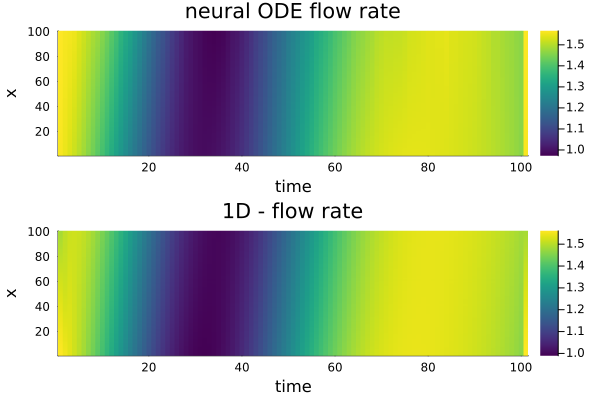

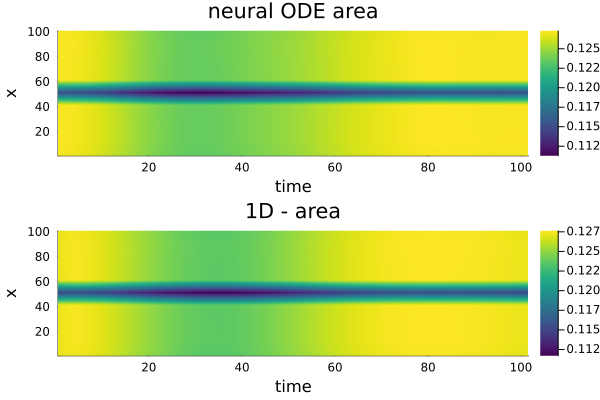

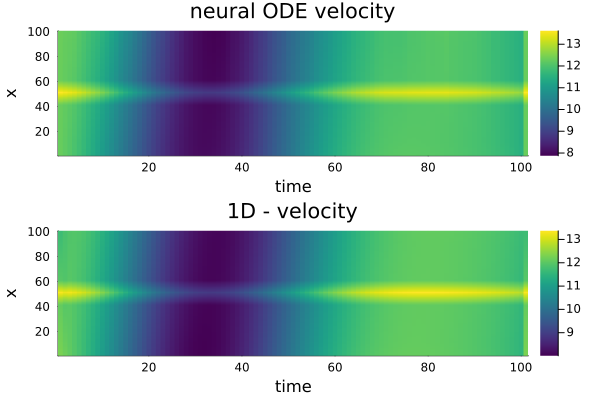

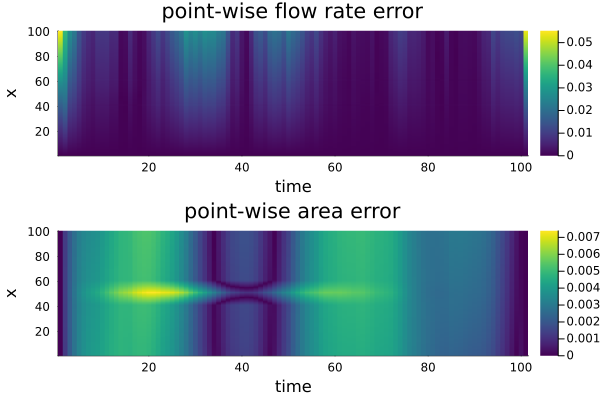

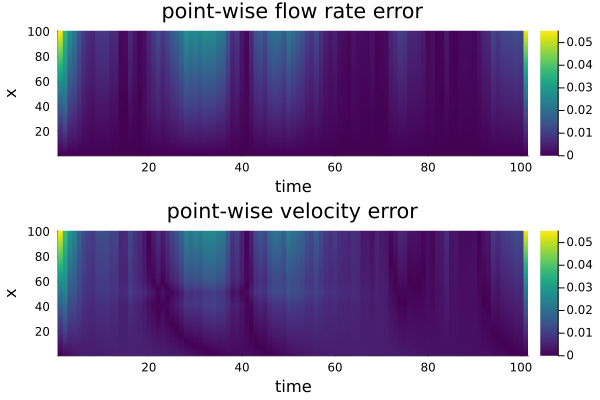

Max point-wise error in Q: 0.05518579895894462
Max point-wise error in S: 0.00738539383670234
Error Q: 0.008020070871875671
Error S: 0.0033781095185572217
Sample 2


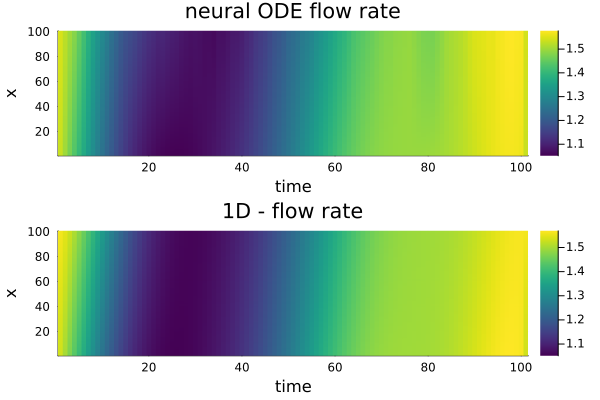

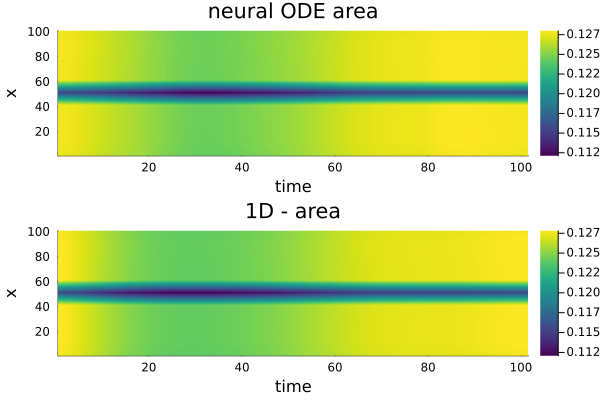

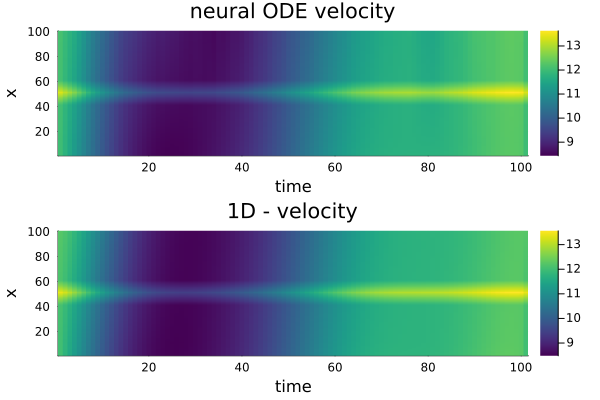

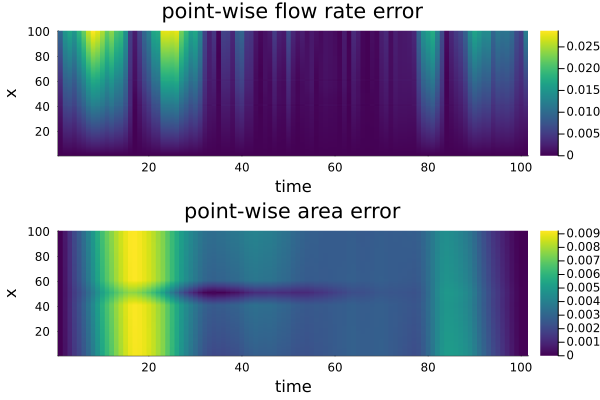

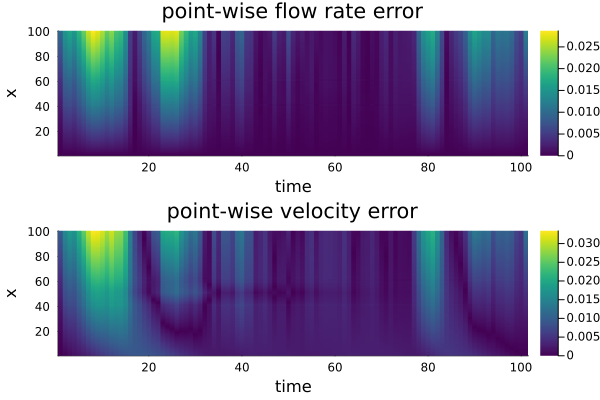

Max point-wise error in Q: 0.028671830813633094
Max point-wise error in S: 0.009217196045023964
Error Q: 0.00710518485294023
Error S: 0.004144409026658133
Sample 3


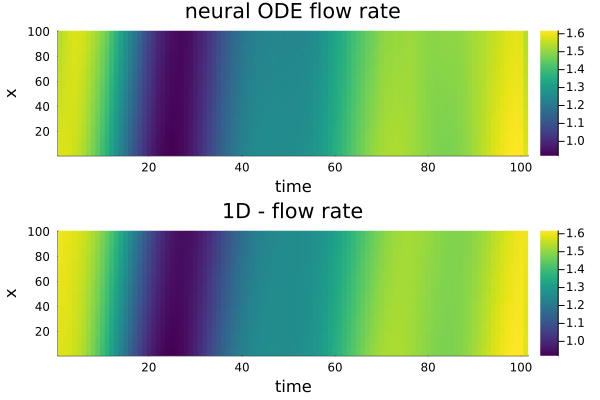

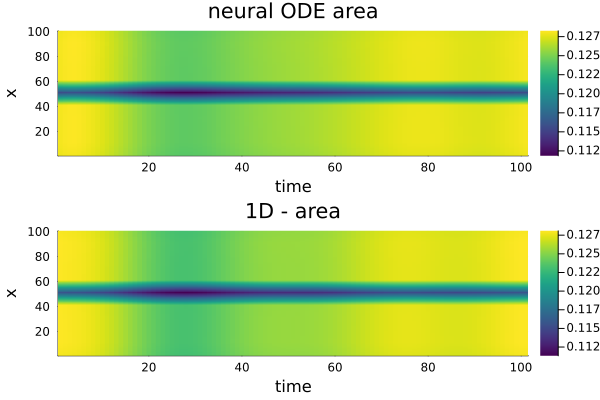

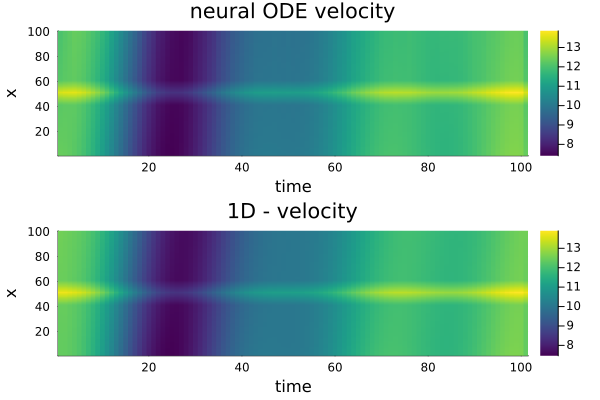

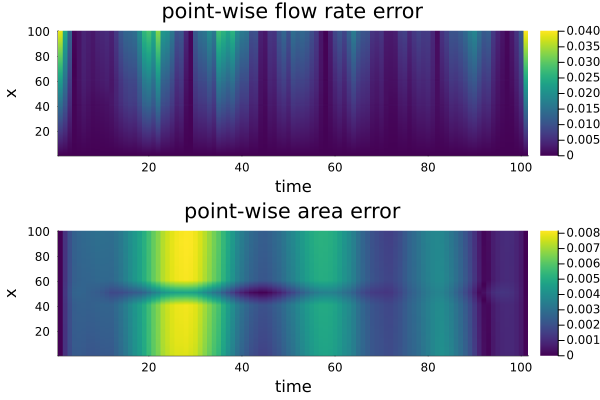

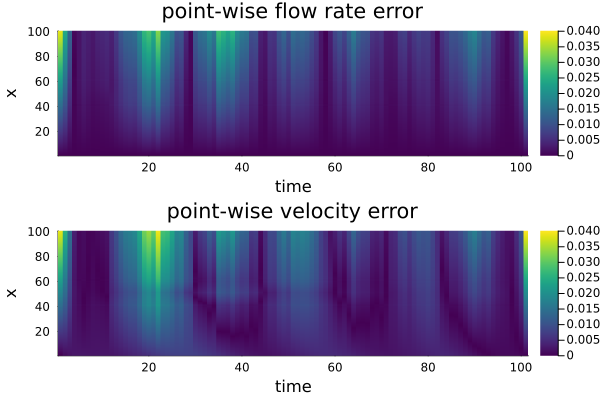

Max point-wise error in Q: 0.04012747273876441
Max point-wise error in S: 0.00815513438592941
Error Q: 0.007602711871600934
Error S: 0.003838174155156939
Sample 4


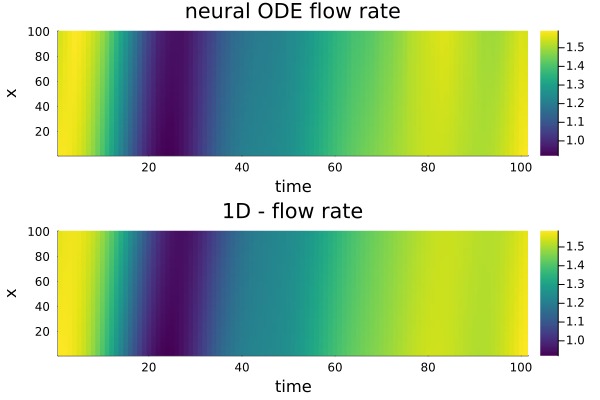

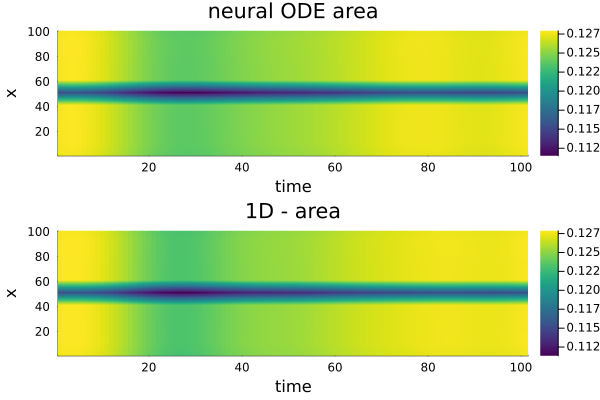

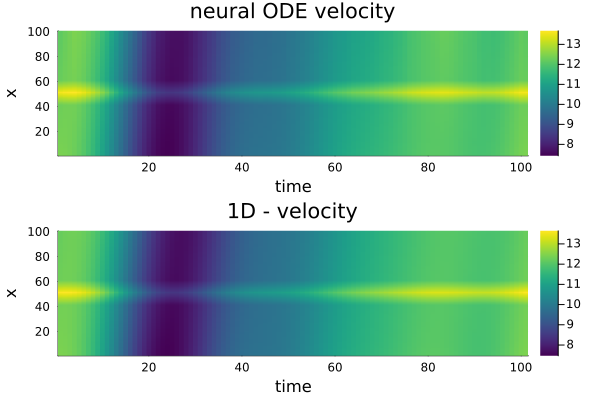

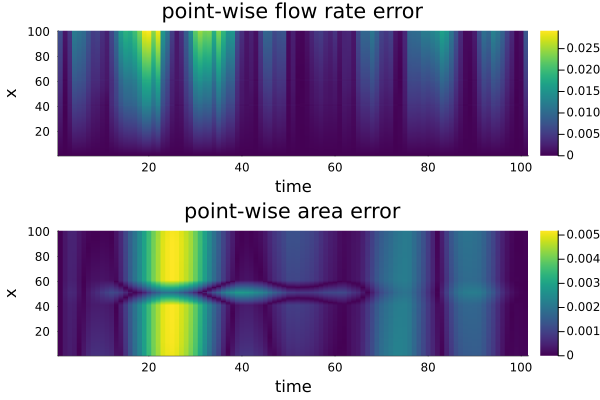

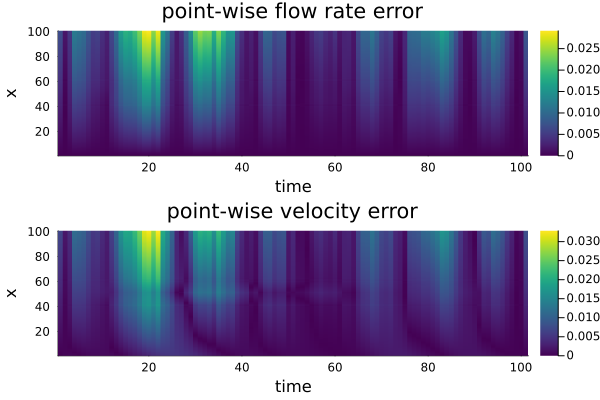

Max point-wise error in Q: 0.02915073703753851
Max point-wise error in S: 0.0051738749701450626
Error Q: 0.006134690751347692
Error S: 0.001792473147880291
Sample 5


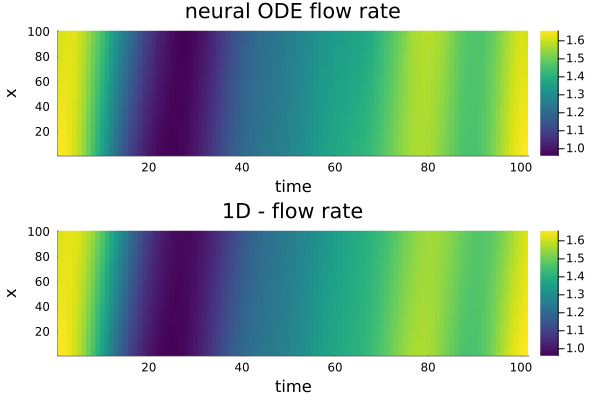

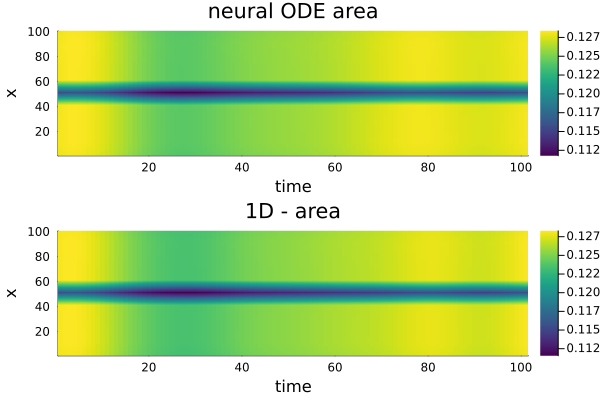

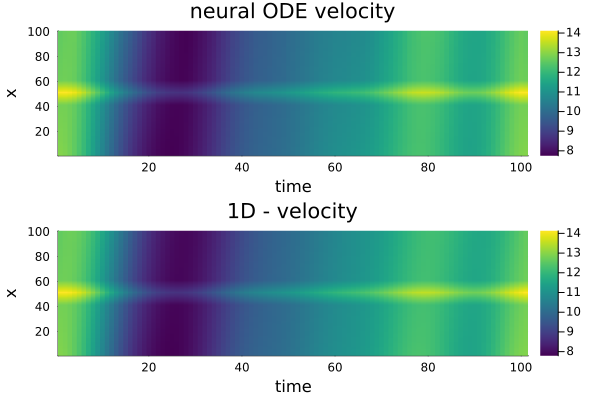

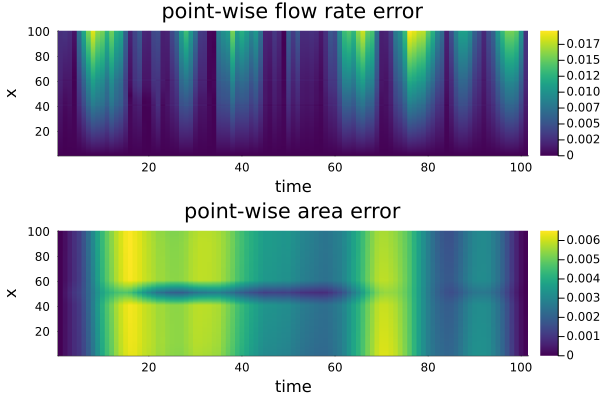

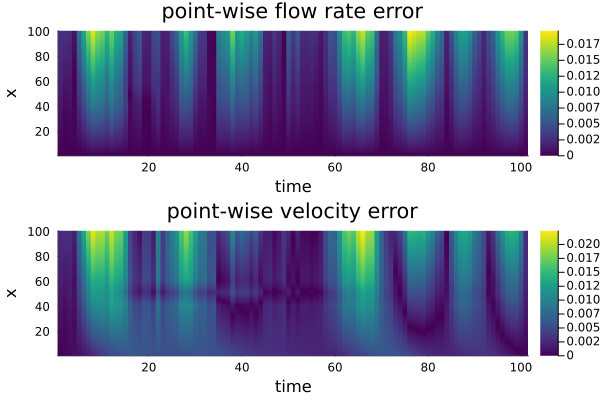

Max point-wise error in Q: 0.019625223276623496
Max point-wise error in S: 0.006502592716026591
Error Q: 0.005929827457077427
Error S: 0.003995214933586871
Sample 6


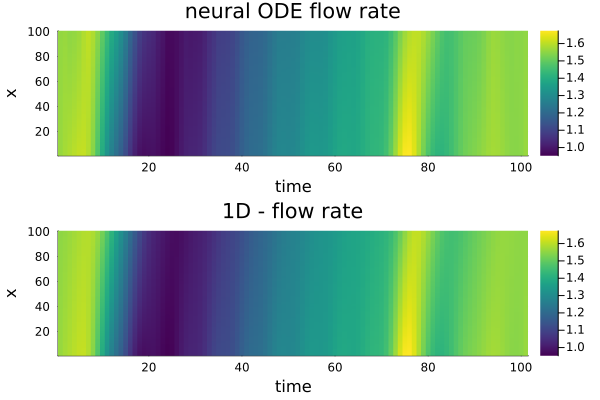

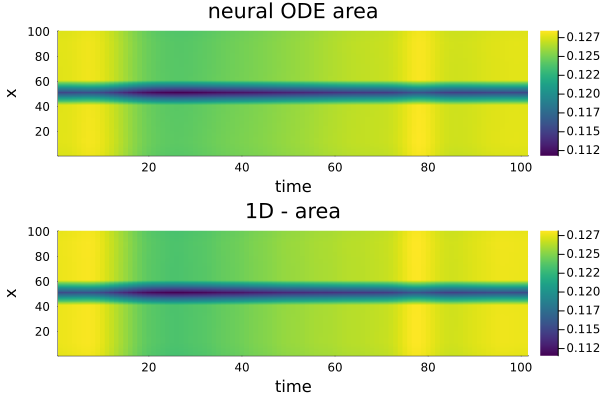

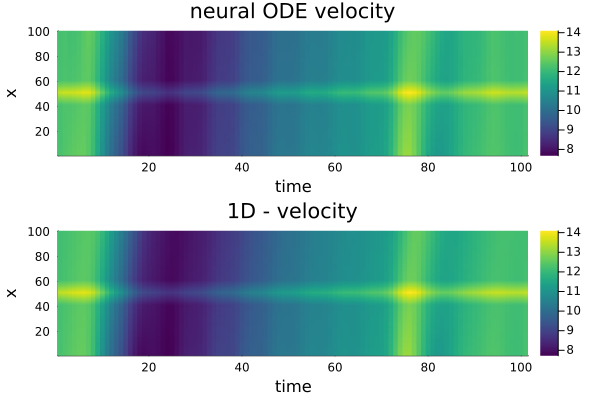

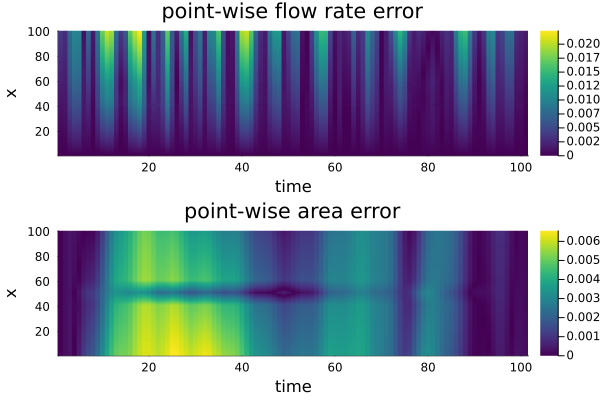

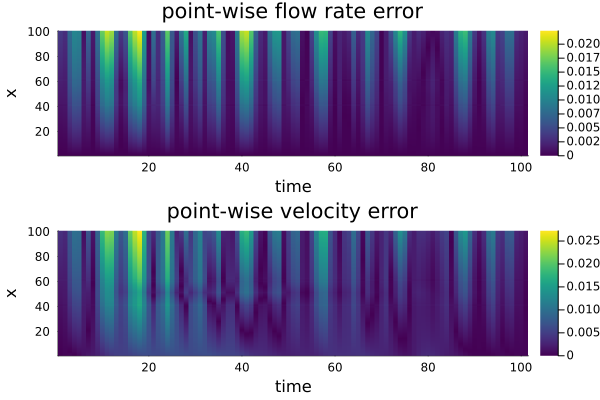

Max point-wise error in Q: 0.022389510845069144
Max point-wise error in S: 0.006549173027309068
Error Q: 0.005079677225501328
Error S: 0.0029793728845200133
Sample 7


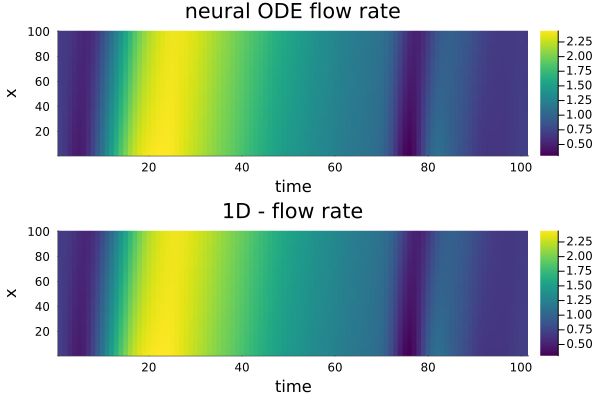

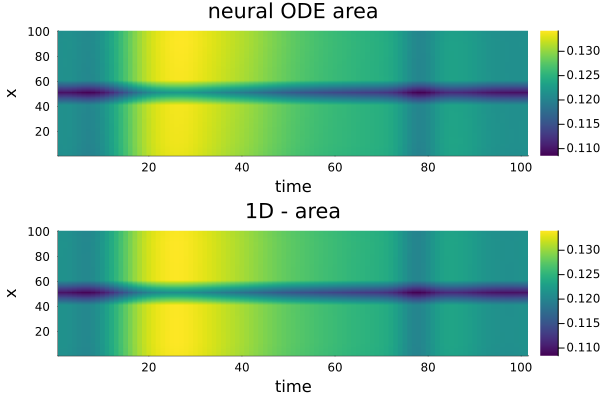

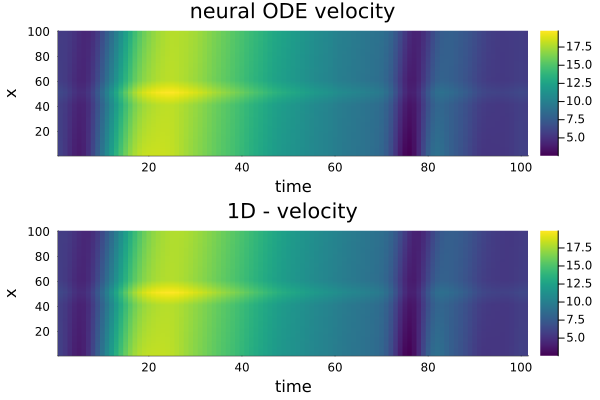

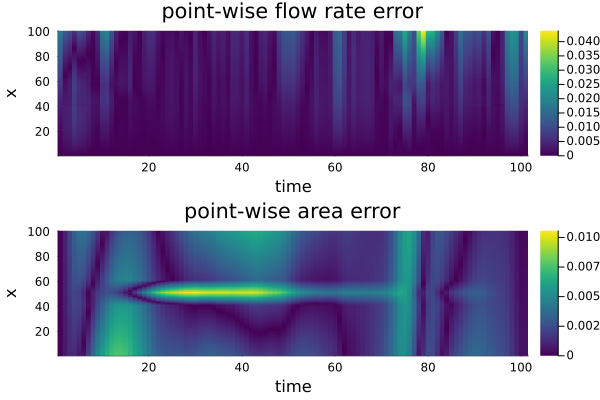

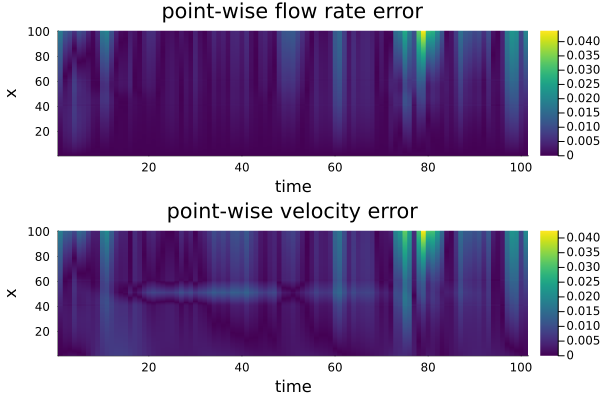

Max point-wise error in Q: 0.043779816990052366
Max point-wise error in S: 0.010554505689992746
Error Q: 0.0034770613884299623
Error S: 0.0029738385139262582
Sample 8


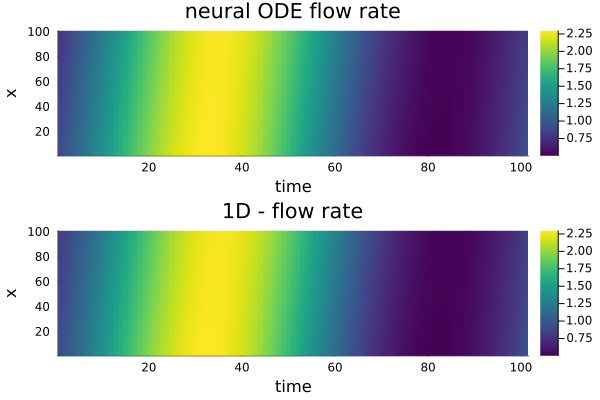

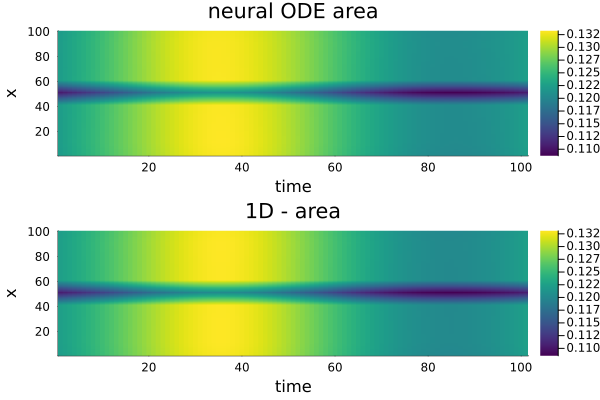

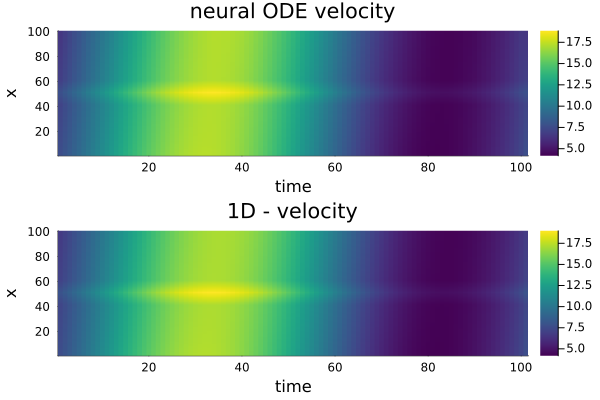

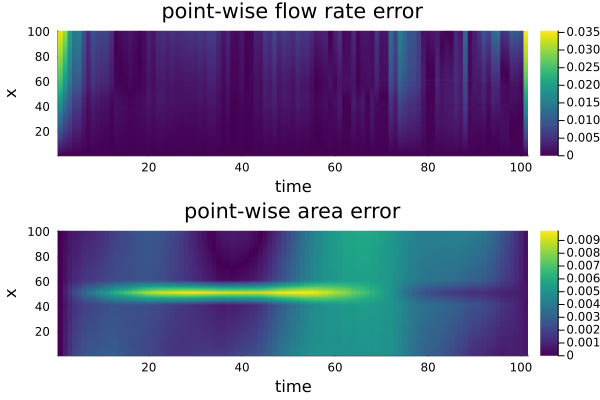

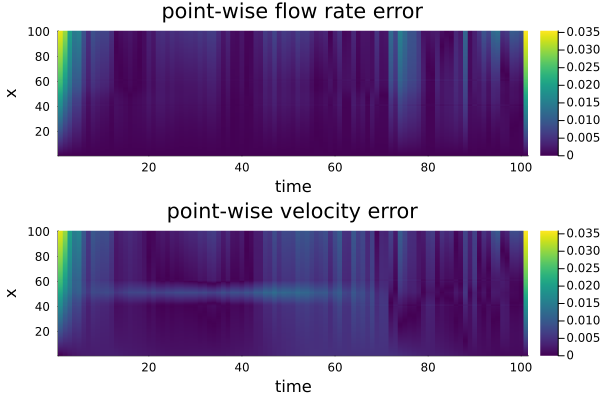

Max point-wise error in Q: 0.03544139068759179
Max point-wise error in S: 0.009744203948855983
Error Q: 0.003438360877448296
Error S: 0.0034864688130314485
Sample 9


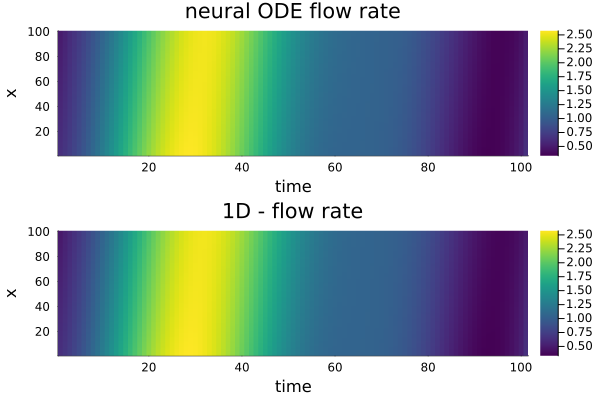

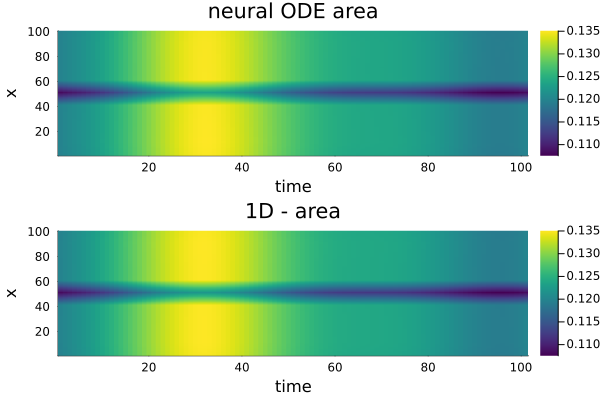

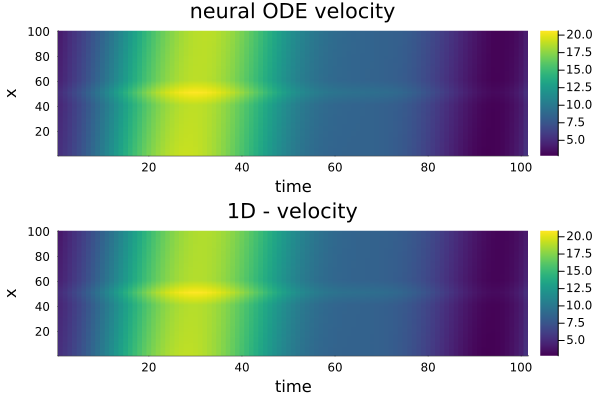

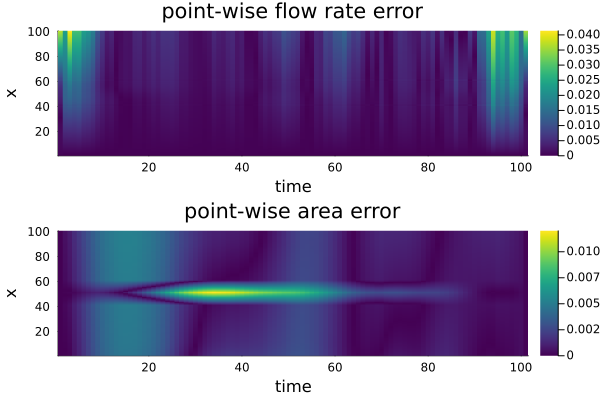

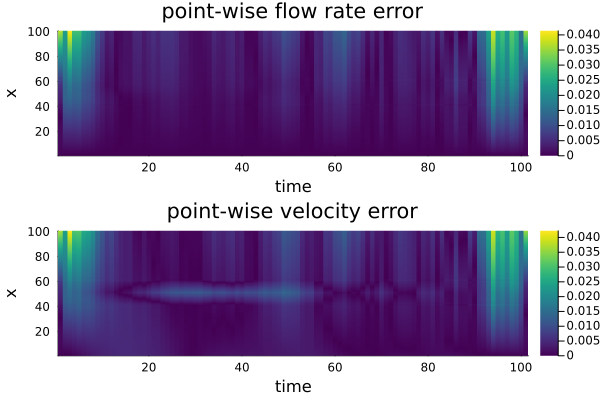

Max point-wise error in Q: 0.041332994004920326
Max point-wise error in S: 0.01200669151044054
Error Q: 0.003494183721686944
Error S: 0.002543794965435806
Sample 10


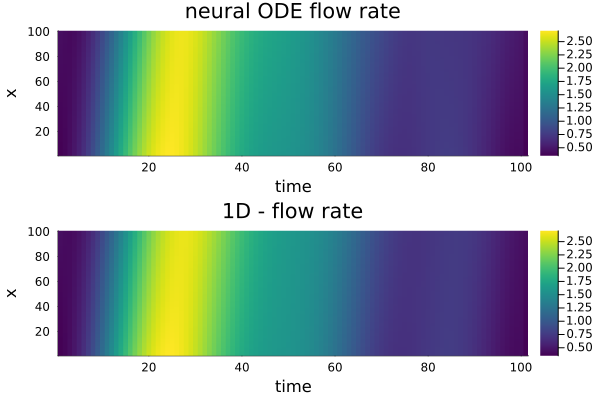

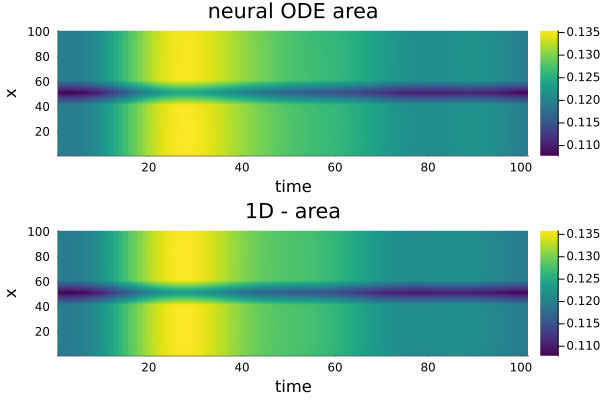

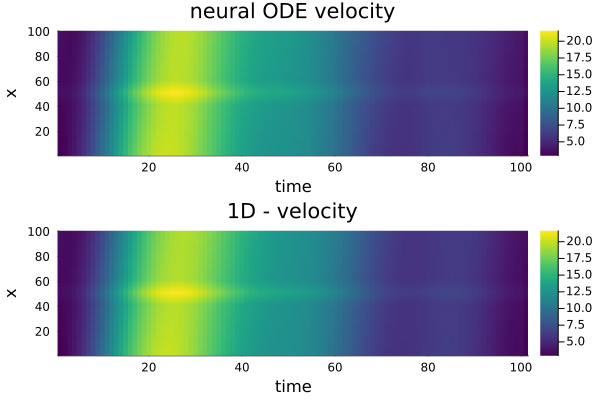

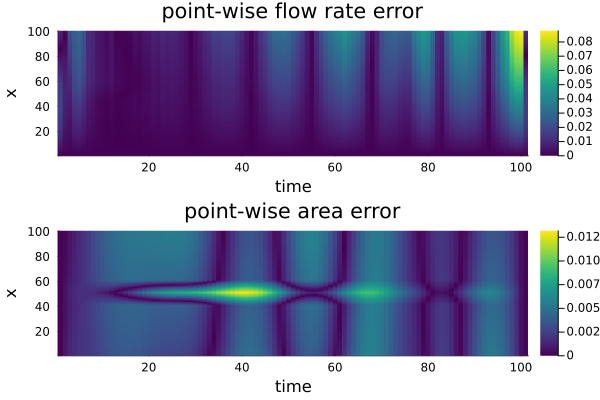

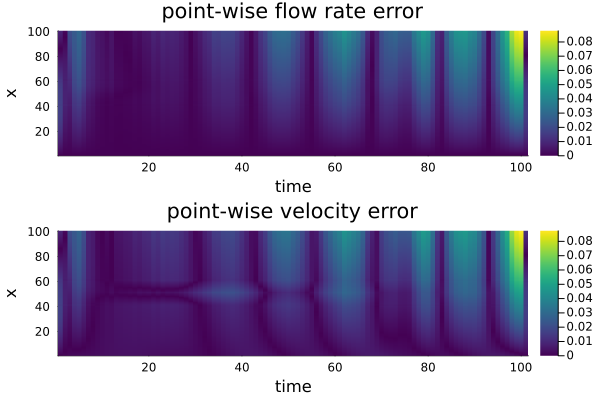

Max point-wise error in Q: 0.08780258931444275
Max point-wise error in S: 0.013171840231886037
Error Q: 0.010264629708598655
Error S: 0.0034876553769114167
Sample 11


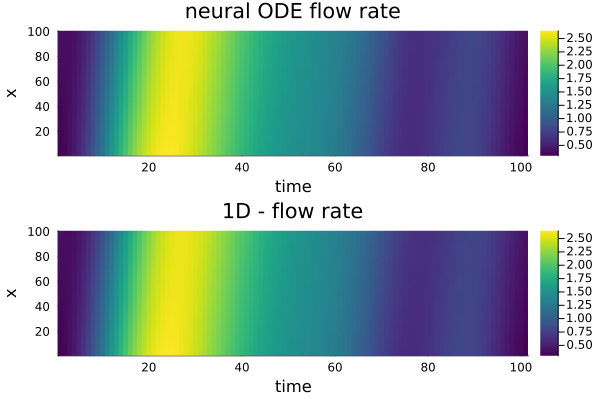

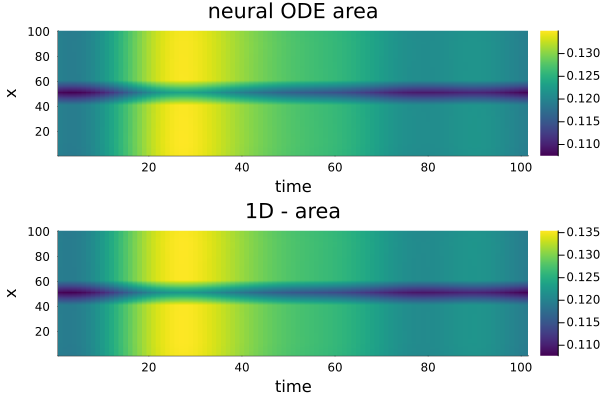

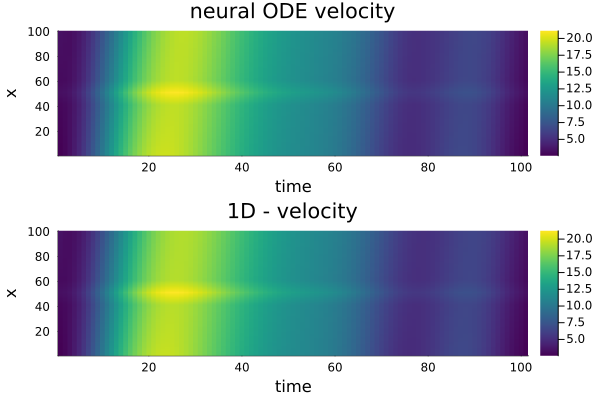

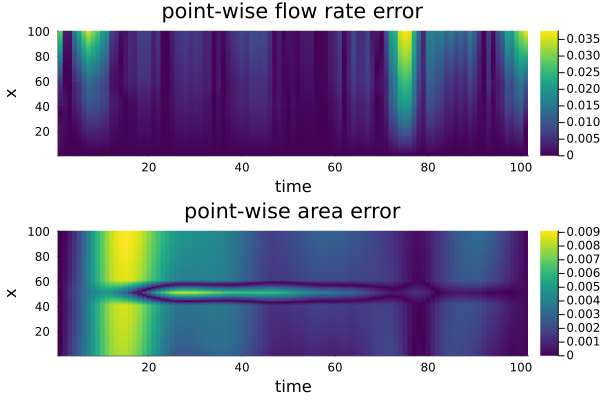

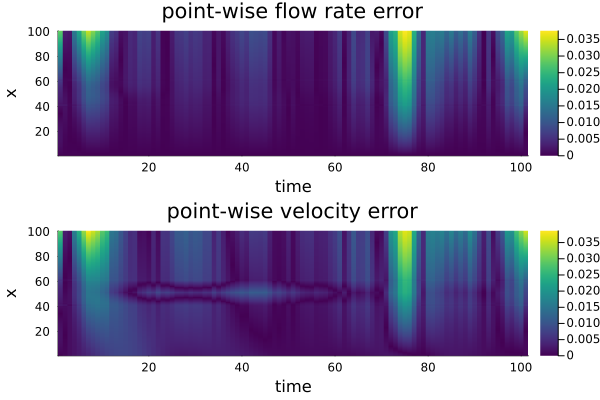

Max point-wise error in Q: 0.037576077372269444
Max point-wise error in S: 0.009108203007523493
Error Q: 0.0042842302386550315
Error S: 0.003510296977614204
Sample 12


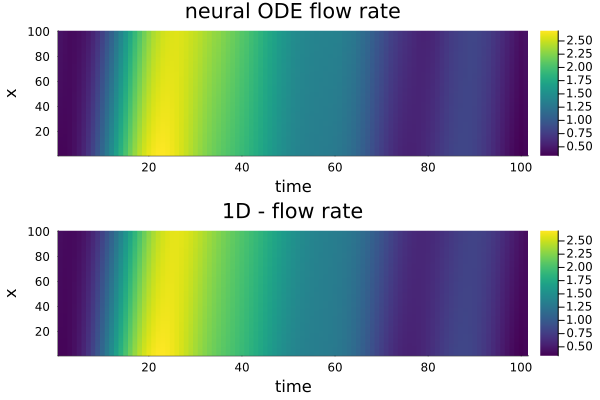

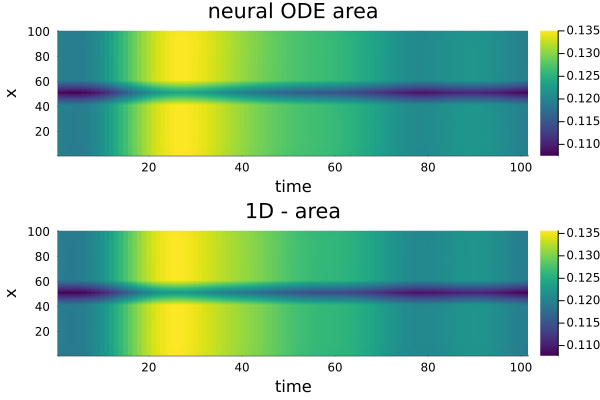

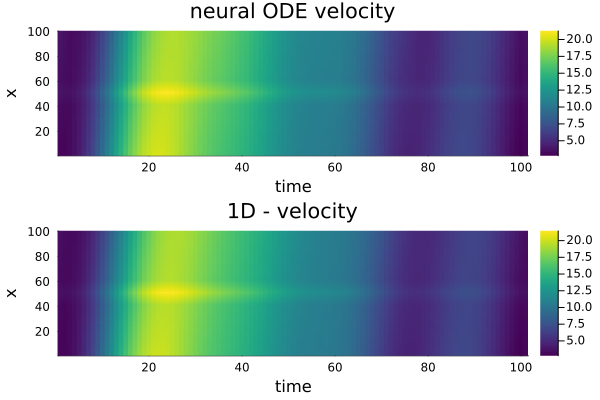

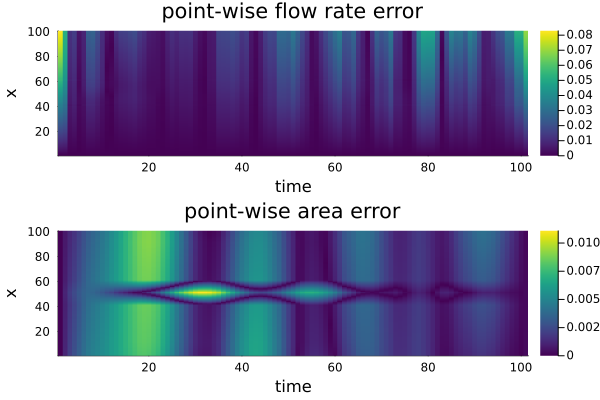

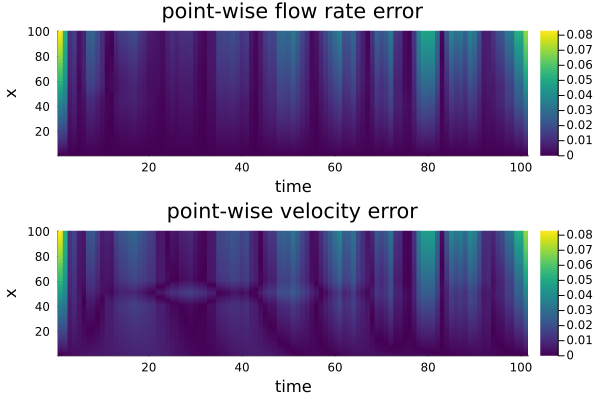

Max point-wise error in Q: 0.0828433724036816
Max point-wise error in S: 0.011081962385196696
Error Q: 0.009199528897127872
Error S: 0.0037591009795688826
Sample 13


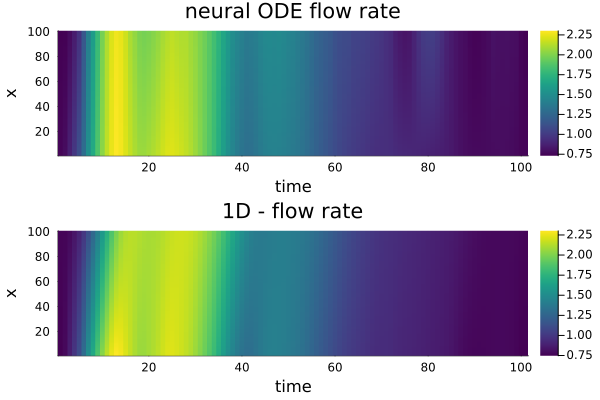

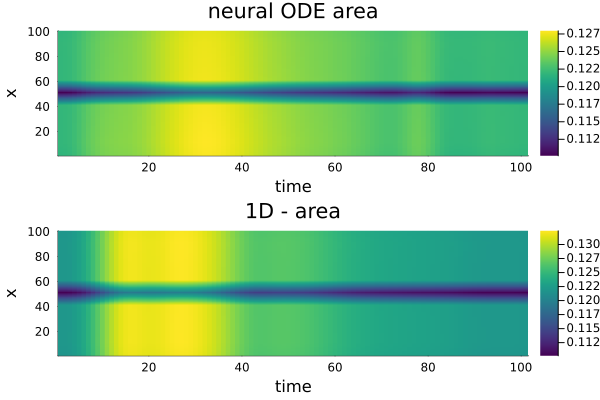

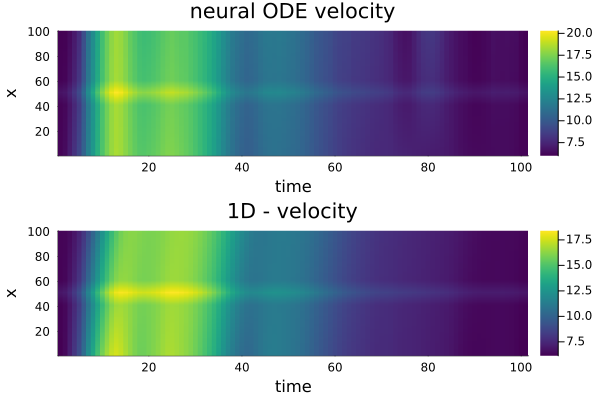

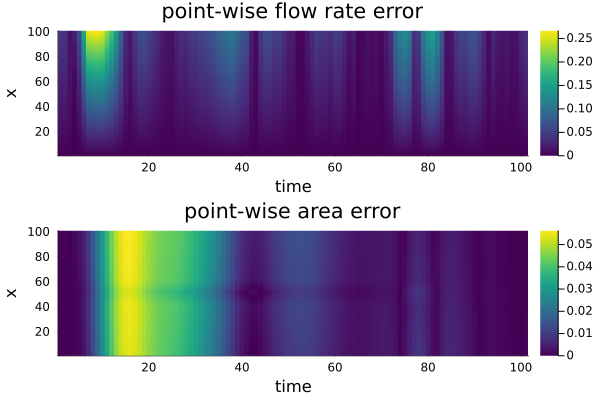

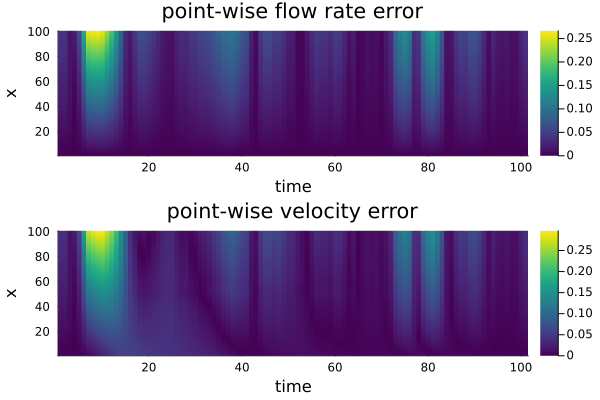

Max point-wise error in Q: 0.2663462663571951
Max point-wise error in S: 0.05616018304142468
Error Q: 0.04839643144478588
Error S: 0.022771604585833098


In [53]:
for i in 1:size(aex)[2]
# plot solution for comparison
# i = 7
    println("Sample ", i)
    plot1 = heatmap(pred_ex_mat[:,i,:]' , color=:viridis, title = "neural ODE flow rate")
    xlabel!("time")
    ylabel!("x")

    plot2 = heatmap(yex[:,i,:]' , title="1D - flow rate", color=:viridis)
    xlabel!("time")
    ylabel!("x")
    display(plot(plot1,plot2,layout = (2, 1)))
    savefig("results_Q.svg")
    sleep(1)

    # plot solution for comparison
    plot1 = heatmap(pred_S_mat_ex[:,i,:]', color=:viridis, title = "neural ODE area")
    xlabel!("time")
    ylabel!("x")

    plot2 = heatmap(aex[:,i,:]', title="1D - area", color=:viridis)
    xlabel!("time")
    ylabel!("x")
    display(plot(plot1,plot2,layout = (2, 1)))
    savefig("results_S.svg")
    sleep(1)



    # plot solution for comparison
    plot1 = heatmap(pred_ex_mat[:,i,:]' ./ pred_S_mat_ex[:,i,:]', color=:viridis, title = "neural ODE velocity")
    xlabel!("time")
    ylabel!("x")

    plot2 = heatmap(yex[:,i,:]' ./ aex[:,i,:]', title="1D - velocity", color=:viridis)
    xlabel!("time")
    ylabel!("x")
    display(plot(plot1,plot2,layout = (2, 1)))
    savefig("results_u.svg")
    sleep(1)


    plot1 = heatmap(abs.(pred_ex_mat[:,i,:]'-yex[:,i,:]')./yex[:,i,:]' , color=:viridis, title = "point-wise flow rate error")
    xlabel!("time")
    ylabel!("x")

    plot2 = heatmap(abs.(pred_S_mat_ex[:,i,:]' - aex[:,i,:]')./aex[:,i,:]', title="point-wise area error", color=:viridis)
    xlabel!("time")
    ylabel!("x")
    display(plot(plot1,plot2,layout = (2, 1)))
    savefig("errors_Q_S.svg")


    plot1 = heatmap(abs.(pred_ex_mat[:,i,:]'-yex[:,i,:]')./yex[:,i,:]' , color=:viridis, title = "point-wise flow rate error")
    xlabel!("time")
    ylabel!("x")

    plot2 = heatmap(abs.(pred_ex_mat[:,i,:]'./pred_S_mat_ex[:,i,:]' - yex[:,i,:]'./aex[:,i,:]')./(yex[:,i,:]'./aex[:,i,:]'), title="point-wise velocity error", color=:viridis)
    xlabel!("time")
    ylabel!("x")
    display(plot(plot1,plot2,layout = (2, 1)))
    savefig("errors_Q_u.svg")

    max_error_Q = maximum(abs.(pred_ex_mat[:,i,:]'-yex[:,i,:]')./yex[:,i,:]')
    max_error_S = maximum(abs.(pred_S_mat_ex[:,i,:]' - aex[:,i,:]')./aex[:,i,:]')

    println("Max point-wise error in Q: ",max_error_Q)
    println("Max point-wise error in S: ",max_error_S)
    println("Error Q: ", norm(pred_ex_mat[:,i,:]'-yex[:,i,:]')./ norm(yex[:,i,:]'))
    println("Error S: ", norm(pred_S_mat_ex[:,i,:]' - aex[:,i,:]')./ norm(aex[:,i,:]'))
end

Sample 7


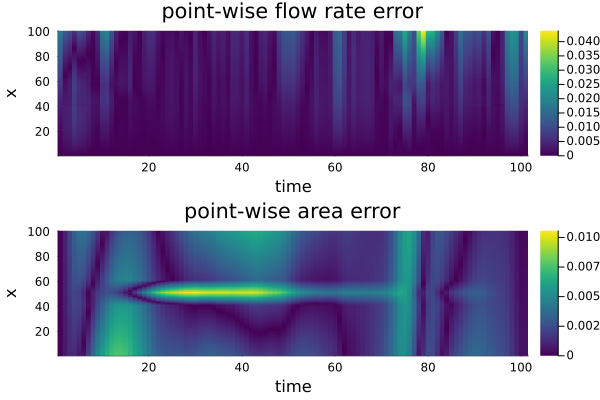

"/home/tschala/research/LANL/dQdz_physics_testNODE/errors_Q_S.svg"

Sample 7


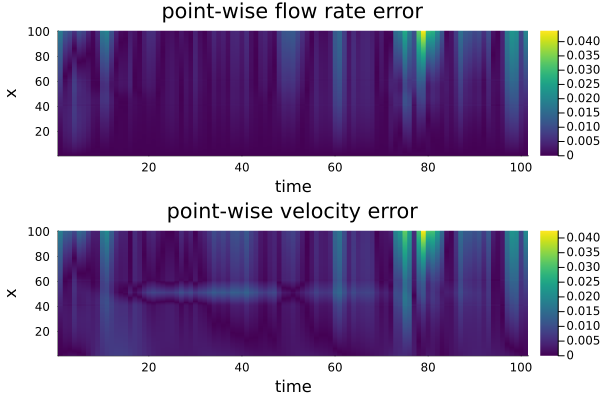

"/home/tschala/research/LANL/dQdz_physics_testNODE/errors_Q_u.svg"